In [1]:
#convert (256x256)


import os
from PIL import Image

image_dir = 'D:/potatoo/images/thesis file/images'  # Directory containing the images
output_dir = 'D:/potatoo/images/thesis file/images/a'  # Directory to save the converted images
output_size = (256, 256)  # Desired size of the converted images
output_format = 'JPEG'  # Desired output file format

def convert_images(directory, output_directory, size, format):
    if not os.path.exists(output_directory):
        os.makedirs(output_directory)

    converted_images = 0

    for filename in os.listdir(directory):
        file_path = os.path.join(directory, filename)
        if os.path.isfile(file_path):
            try:
                with Image.open(file_path) as img:
                    img = img.convert('RGB')  # Convert to RGB if image has an alpha channel
                    img = img.resize(size)  # Resize the image to the desired size (256x256)
                    output_filename = os.path.splitext(filename)[0] + '.jpg'
                    output_path = os.path.join(output_directory, output_filename)
                    img.save(output_path, format=format)
                    converted_images += 1
            except (IOError, OSError):
                print(f"Error processing image: {filename}")
        else:
            print(f"Skipping non-file entry: {filename}")

    print(f"Successfully converted {converted_images} images.")

convert_images(image_dir, output_dir, output_size, output_format)


Skipping non-file entry: a
Successfully converted 10 images.


In [10]:
import os
import random
import shutil

# Path to the 'yld' folder
folder_path = r"D:\JU\project\datademo\train"

# Check if the folder exists
if os.path.isdir(folder_path):
    # List all image files in the folder (you can add other extensions if needed)
    images = [file for file in os.listdir(folder_path) if file.endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif'))]
    
    # Number of extra images to add
    num_extra_images = 500

    # Check how many images are currently in the folder
    num_images = len(images)

    # If there are fewer than 500 images, we will copy images randomly
    if num_images > 0:
        copies_needed = num_extra_images
        while copies_needed > 0:
            # Randomly pick images to copy
            random_images = random.sample(images, min(copies_needed, num_images))

            # Copy and rename the images
            for index, image in enumerate(random_images, start=1):
                new_image_name = f"f{num_images + index}.jpg"  # Rename to c1, c2, ..., c500
                old_image_path = os.path.join(folder_path, image)
                new_image_path = os.path.join(folder_path, new_image_name)

                # Copy the image to the same folder with the new name
                shutil.copy(old_image_path, new_image_path)
                print(f"Copied and renamed {old_image_path} to {new_image_path}")

            # Decrease the remaining number of copies needed
            copies_needed -= len(random_images)

    else:
        print(f"No images found in the folder {folder_path}.")
else:
    print(f"The folder {folder_path} does not exist.")


No images found in the folder D:\JU\project\datademo\train.


In [ ]:


# flipped_image_horizontal,flipped_image_vertical,zoomed_image,brightened_image,brightened_image,gamma_corrected_image,noisy_image



In [2]:
import os
import numpy as np
from PIL import Image, ImageEnhance
from skimage.util import random_noise

# Folder path containing the images
folder_path = "D:/potatoo/images/thesis file/images"  # Replace with the path to your folder containing the images

# Output folder for saving transformed images
output_folder = "D:/potatoo/images/thesis file/images"  # Replace with the desired output folder path

# Create the output folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)


def apply_gamma_correction(image, gamma):
    # Apply gamma correction to the image
    np_image = np.array(image)
    gamma_corrected = np.array(255 * (np_image / 255) ** gamma, dtype=np.uint8)
    return Image.fromarray(gamma_corrected)


def apply_noise_injection(image, noise_type, noise_strength):
    # Apply noise injection to the image
    np_image = np.array(image)
    noisy_image = random_noise(np_image, mode=noise_type, var=noise_strength)
    noisy_image = np.array(255 * noisy_image, dtype=np.uint8)
    return Image.fromarray(noisy_image)


# Iterate over each file in the folder
for filename in os.listdir(folder_path):
    # Check if the file is an image
    if filename.endswith(".jpg") or filename.endswith(".png"):
        # Load the image
        image_path = os.path.join(folder_path, filename)
        image = Image.open(image_path)

        # Resize the image to 256x256 pixels
        image = image.resize((256, 256))

        # Image rotation
        angle = 45
        rotated_image = image.rotate(angle)

        # Image flipping
        flipped_image_horizontal = image.transpose(Image.FLIP_LEFT_RIGHT)
        flipped_image_vertical = image.transpose(Image.FLIP_TOP_BOTTOM)

        # Image shifting
        shift_x = 50
        shift_y = 50
        shifted_image = image.transform(image.size, Image.AFFINE, (1, 0, shift_x, 0, 1, shift_y))

        # Image zooming
        zoom_factor = 1.5
        zoomed_image = image.resize((int(image.width * zoom_factor), int(image.height * zoom_factor))).resize((256, 256))

        # Image shearing
        shear_factor = 0.5
        sheared_image = image.transform(image.size, Image.AFFINE, (1, shear_factor, 0, 0, 1, 0))

        # Image scaling
        scale_factor = 0.5
        scaled_image = image.resize((int(image.width * scale_factor), int(image.height * scale_factor))).resize((256, 256))

        # Image brightness adjustment
        brightness_factor = 0.5
        enhancer = ImageEnhance.Brightness(image)
        brightened_image = enhancer.enhance(brightness_factor)

        # Image cropping
        left = 100
        top = 100
        right = 300
        bottom = 300
        cropped_image = image.crop((left, top, right, bottom)).resize((256, 256))

        # Gamma correction
        gamma = 1.5
        gamma_corrected_image = apply_gamma_correction(image, gamma)

        # Noise injection
        noise_type = 'gaussian'
        noise_strength = 0.1
        noisy_image = apply_noise_injection(image, noise_type, noise_strength)

        # Save the transformed images
        rotated_image.save(os.path.join(output_folder, "rotated_" + filename))
        flipped_image_horizontal.save(os.path.join(output_folder, "flipped_horizontal_" + filename))
        flipped_image_vertical.save(os.path.join(output_folder, "flipped_vertical_" + filename))
        shifted_image.save(os.path.join(output_folder, "shifted_" + filename))
        zoomed_image.save(os.path.join(output_folder, "zoomed_" + filename))
        sheared_image.save(os.path.join(output_folder, "sheared_" + filename))
        scaled_image.save(os.path.join(output_folder, "scaled_" + filename))
        brightened_image.save(os.path.join(output_folder, "brightened_" + filename))
        #cropped_image.save(os.path.join(output_folder, "cropped_" + filename))
        gamma_corrected_image.save(os.path.join(output_folder, "gamma_corrected_" + filename))
        noisy_image.save(os.path.join(output_folder, "noisy_" + filename))
# flipped_image_horizontal,flipped_image_vertical,zoomed_image,brightened_image,brightened_image,gamma_corrected_image,noisy_image

In [25]:
import os
import random
import shutil

# Path to the 'yld' folder
folder_path = r"D:\JU\project\datademo\train\yld"

# Check if the folder exists
if os.path.isdir(folder_path):
    # List all image files in the folder
    images = [file for file in os.listdir(folder_path) if file.endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif'))]
    
    # Number of extra images to add
    num_extra_images = 1000

    # Check how many images are currently in the folder
    num_images = len(images)

    # If there are images available, proceed to create extra images
    if num_images > 0:
        copies_needed = num_extra_images
        while copies_needed > 0:
            # Randomly pick images to copy
            random_images = random.sample(images, min(copies_needed, num_images))

            # Copy and rename the images
            for index, image in enumerate(random_images, start=1):
                new_image_name = f"f2{num_images + index}.jpg"  # Rename to f1, f2, ..., f1000
                old_image_path = os.path.join(folder_path, image)
                new_image_path = os.path.join(folder_path, new_image_name)

                # Copy the image to the same folder with the new name
                shutil.copy(old_image_path, new_image_path)
                print(f"Copied and renamed {old_image_path} to {new_image_path}")

            # Decrease the remaining number of copies needed
            copies_needed -= len(random_images)

    else:
        print(f"No images found in the folder {folder_path}.")
else:
    print(f"The folder {folder_path} does not exist.")


Copied and renamed D:\JU\project\datademo\train\yld\f210.jpg to D:\JU\project\datademo\train\yld\f21889.jpg
Copied and renamed D:\JU\project\datademo\train\yld\f11207.jpg to D:\JU\project\datademo\train\yld\f21890.jpg
Copied and renamed D:\JU\project\datademo\train\yld\f11505.jpg to D:\JU\project\datademo\train\yld\f21891.jpg
Copied and renamed D:\JU\project\datademo\train\yld\f485.jpg to D:\JU\project\datademo\train\yld\f21892.jpg
Copied and renamed D:\JU\project\datademo\train\yld\f627.jpg to D:\JU\project\datademo\train\yld\f21893.jpg
Copied and renamed D:\JU\project\datademo\train\yld\g324.jpg to D:\JU\project\datademo\train\yld\f21894.jpg
Copied and renamed D:\JU\project\datademo\train\yld\f11478.jpg to D:\JU\project\datademo\train\yld\f21895.jpg
Copied and renamed D:\JU\project\datademo\train\yld\f11062.jpg to D:\JU\project\datademo\train\yld\f21896.jpg
Copied and renamed D:\JU\project\datademo\train\yld\f11140.jpg to D:\JU\project\datademo\train\yld\f21897.jpg
Copied and renamed

In [29]:
import os
from PIL import Image, ImageEnhance

# Path to the 'test' folder
test_folder = r"D:\JU\project\datademo\data\test"

# Gamma value for correction (you can adjust this value)
gamma_value = 1.2  # You can set this to any value > 0 (values > 1 darken, < 1 brighten)

# Function to apply gamma correction to an image
def apply_gamma_correction(image, gamma):
    enhancer = ImageEnhance.Brightness(image)
    image = enhancer.enhance(gamma)
    return image

# Iterate over each subfolder in the 'test' folder
for subfolder_name in os.listdir(test_folder):
    subfolder_path = os.path.join(test_folder, subfolder_name)

    # Check if it is a directory (subfolder)
    if os.path.isdir(subfolder_path):
        # Iterate over each image file in the subfolder
        for image_name in os.listdir(subfolder_path):
            image_path = os.path.join(subfolder_path, image_name)

            # Check if the file is an image (you can add other extensions if needed)
            if image_name.endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif')):
                # Open the image
                with Image.open(image_path) as img:
                    # Apply gamma correction
                    img_gamma = apply_gamma_correction(img, gamma_value)

                    # Convert the image to black and white (grayscale)
                    img_bw = img_gamma.convert("L")

                    # Save the transformed image with both effects (Gamma + BW)
                    new_image_name = f"gamma_bw_{image_name}"
                    new_image_path = os.path.join(subfolder_path, new_image_name)
                    img_bw.save(new_image_path)

                    print(f"Processed and saved {new_image_path} (Gamma corrected + BW)")

    else:
        print(f"{subfolder_path} is not a directory.")


Processed and saved D:\JU\project\datademo\data\test\black_mold\gamma_bw_gamma_bw_test1.jpg (Gamma corrected + BW)
Processed and saved D:\JU\project\datademo\data\test\black_mold\gamma_bw_gamma_bw_test10.jpg (Gamma corrected + BW)
Processed and saved D:\JU\project\datademo\data\test\black_mold\gamma_bw_gamma_bw_test100.jpg (Gamma corrected + BW)
Processed and saved D:\JU\project\datademo\data\test\black_mold\gamma_bw_gamma_bw_test101.jpg (Gamma corrected + BW)
Processed and saved D:\JU\project\datademo\data\test\black_mold\gamma_bw_gamma_bw_test102.jpg (Gamma corrected + BW)
Processed and saved D:\JU\project\datademo\data\test\black_mold\gamma_bw_gamma_bw_test103.jpg (Gamma corrected + BW)
Processed and saved D:\JU\project\datademo\data\test\black_mold\gamma_bw_gamma_bw_test104.jpg (Gamma corrected + BW)
Processed and saved D:\JU\project\datademo\data\test\black_mold\gamma_bw_gamma_bw_test105.jpg (Gamma corrected + BW)
Processed and saved D:\JU\project\datademo\data\test\black_mold\gam

In [27]:
import os
import random
import shutil

# Path to the 'train' and 'test' folders
train_folder = r"D:\JU\project\datademo\data\train"
test_folder = r"D:\JU\project\datademo\data\test"

# Ensure the 'test' folder exists
if not os.path.exists(test_folder):
    os.makedirs(test_folder)

# Iterate over each subfolder in the 'train' folder
for subfolder_name in os.listdir(train_folder):
    subfolder_path = os.path.join(train_folder, subfolder_name)

    # Check if it is a directory (subfolder)
    if os.path.isdir(subfolder_path):
        # List all image files in the subfolder (you can add more extensions if needed)
        images = [file for file in os.listdir(subfolder_path) if file.endswith(('.jpg', '.jpeg', '.png', '.bmp', '.gif'))]
        
        # Number of images to move (20% of the images in the folder)
        num_images_to_move = int(len(images) * 0.2)

        # If there are enough images, proceed
        if num_images_to_move > 0:
            # Randomly sample 20% of the images to move
            images_to_move = random.sample(images, num_images_to_move)

            # Create the corresponding subfolder in the 'test' folder if it doesn't exist
            test_subfolder_path = os.path.join(test_folder, subfolder_name)
            if not os.path.exists(test_subfolder_path):
                os.makedirs(test_subfolder_path)

            # Move and rename the images
            for index, image in enumerate(images_to_move, start=1):
                old_image_path = os.path.join(subfolder_path, image)
                new_image_name = f"test{index}.jpg"  # Rename image (you can customize the naming scheme)
                new_image_path = os.path.join(test_subfolder_path, new_image_name)

                # Move the image to the 'test' folder with the new name
                shutil.move(old_image_path, new_image_path)
                print(f"Moved and renamed {old_image_path} to {new_image_path}")

        else:
            print(f"Not enough images in {subfolder_name} to move.")

    else:
        print(f"{subfolder_name} is not a directory.")


Moved and renamed D:\JU\project\datademo\data\train\black_mold\g1827.jpg to D:\JU\project\datademo\data\test\black_mold\test1.jpg
Moved and renamed D:\JU\project\datademo\data\train\black_mold\g1065.jpg to D:\JU\project\datademo\data\test\black_mold\test2.jpg
Moved and renamed D:\JU\project\datademo\data\train\black_mold\g1120.jpg to D:\JU\project\datademo\data\test\black_mold\test3.jpg
Moved and renamed D:\JU\project\datademo\data\train\black_mold\151_enhanced.jpg to D:\JU\project\datademo\data\test\black_mold\test4.jpg
Moved and renamed D:\JU\project\datademo\data\train\black_mold\103.jpg to D:\JU\project\datademo\data\test\black_mold\test5.jpg
Moved and renamed D:\JU\project\datademo\data\train\black_mold\g1077.jpg to D:\JU\project\datademo\data\test\black_mold\test6.jpg
Moved and renamed D:\JU\project\datademo\data\train\black_mold\g1559.jpg to D:\JU\project\datademo\data\test\black_mold\test7.jpg
Moved and renamed D:\JU\project\datademo\data\train\black_mold\g1284.jpg to D:\JU\pro

In [ ]:
#delete_similar_images(folders)

In [8]:
import os
import shutil
from PIL import Image
import imagehash

# Function to compute image hash using Average Hashing (aHash)
def compute_image_hash(image_path):
    with Image.open(image_path) as img:
        hash_value = imagehash.average_hash(img)
    return hash_value

# Function to compare image hashes and delete similar images
def delete_similar_images(folders):
    images_hashes = {}
    
    # Iterate over folders and compute image hashes
    for folder in folders:
        images = [file for file in os.listdir(folder) if file.endswith('.jpg') or file.endswith('.png')]
        for image in images:
            image_path = os.path.join(folder, image)
            hash_value = compute_image_hash(image_path)
            if hash_value in images_hashes:
                images_hashes[hash_value].append(image_path)
            else:
                images_hashes[hash_value] = [image_path]
    
    # Delete similar images
    for hash_value, images in images_hashes.items():
        if len(images) > 1:
            for i in range(1, len(images)):
                os.remove(images[i])
                print(f"Deleted similar image: {images[i]}")
    
    print("Done!")

# Specify the folders to compare and delete similar images
folders = [
    "D:\\JU\\project\\datademo\\train\\black_mold",
    "D:\\JU\\project\\datademo\\train\\healthy_fruit",
    "D:\\JU\\project\\datademo\\train\\healthy_leaf",
    "D:\\JU\\project\\datademo\\train\\insect_bite",
    "D:\\JU\\project\\datademo\\train\\multiple",
    "D:\\JU\\project\\datademo\\train\\red_rust",
    "D:\\JU\\project\\datademo\\train\\scab",
    "D:\\JU\\project\\datademo\\train\\scorch",
    "D:\\JU\\project\\datademo\\train\\yld"
]


# Call the function to delete similar images
delete_similar_images(folders)


Deleted similar image: D:\JU\project\datademo\train\black_mold\c1.jpg
Deleted similar image: D:\JU\project\datademo\train\black_mold\c1193.jpg
Deleted similar image: D:\JU\project\datademo\train\black_mold\c1659.jpg
Deleted similar image: D:\JU\project\datademo\train\black_mold\c1714.jpg
Deleted similar image: D:\JU\project\datademo\train\black_mold\c1798.jpg
Deleted similar image: D:\JU\project\datademo\train\black_mold\c887.jpg
Deleted similar image: D:\JU\project\datademo\train\black_mold\c997.jpg
Deleted similar image: D:\JU\project\datademo\train\black_mold\c1319.jpg
Deleted similar image: D:\JU\project\datademo\train\black_mold\c1322.jpg
Deleted similar image: D:\JU\project\datademo\train\black_mold\c1411.jpg
Deleted similar image: D:\JU\project\datademo\train\black_mold\c2.jpg
Deleted similar image: D:\JU\project\datademo\train\black_mold\c922.jpg
Deleted similar image: D:\JU\project\datademo\train\black_mold\c1113.jpg
Deleted similar image: D:\JU\project\datademo\train\black_mo

Deleted similar image: D:/P/Training/Potato_Healthy_Leaf\scaled_Potato_healthy-118-_0_343.jpg
Deleted similar image: D:/P/Training/Potato_Healthy_Leaf\zoomed_Potato_healthy-118-_0_343.jpg
Deleted similar image: D:/P/Training/Potato_Healthy_Leaf\gamma_corrected_Potato_healthy-118-_0_3622.jpg
Deleted similar image: D:/P/Training/Potato_Healthy_Leaf\noisy_Potato_healthy-118-_0_3622.jpg
Deleted similar image: D:/P/Training/Potato_Healthy_Leaf\Potato_healthy-118-_0_3622.jpg
Deleted similar image: D:/P/Training/Potato_Healthy_Leaf\scaled_Potato_healthy-118-_0_3622.jpg
Deleted similar image: D:/P/Training/Potato_Healthy_Leaf\zoomed_Potato_healthy-118-_0_3622.jpg
Deleted similar image: D:/P/Training/Potato_Healthy_Leaf\gamma_corrected_Potato_healthy-119-_0_3500.jpg
Deleted similar image: D:/P/Training/Potato_Healthy_Leaf\noisy_Potato_healthy-119-_0_3500.jpg
Deleted similar image: D:/P/Training/Potato_Healthy_Leaf\gamma_corrected_Potato_healthy-119-_0_3520.jpg
Deleted similar image: D:/P/Traini

Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\brightened_Early_Blight_148.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\Early_Blight_148.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\noisy_Early_Blight_148.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\scaled_Early_Blight_148.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\zoomed_Early_Blight_148.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\flipped_vertical_Late_Blight_297.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\flipped_vertical_Late_Blight_290.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\flipped_horizontal_Early_Blight_241.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\brightened_Early_Blight_1011.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\brightened_Early_Blight_571.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\Early

Deleted similar image: D:/P/Training/Potato_Healthy_Leaf\shifted_Potato_healthy-114-_0_8110.jpg
Deleted similar image: D:/P/Training/Potato_Healthy_Leaf\shifted_Potato_healthy-98-_0_9109.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\shifted_0d987d4a-26bc-4f74-8a16-12f8969dfed8___RS_Early.B 7013.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\shifted_15ab8118-01fb-4e9c-83a9-94ab224d6854___RS_Early.B 7962.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\shifted_1769d41b-fd4c-49b1-adce-e89fee6a352e___RS_Early.B 6741.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\shifted_2b8cfa81-e20f-4c28-b403-2cec2e5c0f2a___RS_Early.B 8145.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\shifted_70b89c8b-2850-4ec8-8da1-a4b9de5351c7___RS_Early.B 6889.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\shifted_7ea05f87-83d3-405e-84ee-f637426f4bab___RS_Early.B 6715.jpg
Deleted similar image: D:/P/Trainin

Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\shifted_Late_Blight_1035.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\shifted_096f6928-24dd-4efd-acc6-b8246318676c___RS_Early.B 8970.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\shifted_216a1a08-c4be-4fa9-b880-c260909e1dbc___RS_Early.B 6881.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\shifted_fbc1b154-7b53-4ac5-ad3a-5e9e5078a289___RS_Early.B 7551.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\shifted_fc1ab935-21b3-42e7-a870-02fd71c5d845___RS_Early.B 6894.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\shifted_86323439-ca8d-4819-ae81-800e50f85770___RS_LB 2826.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\shifted_d0262161-b887-4357-b707-cde01cf5726d___RS_LB 3044.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\shifted_f528e881-b237-4797-ab54-0152eb901f53___RS_LB 3854.jpg
Deleted similar image: D:

Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\zoomed_bf972aad-9f3f-40c8-9fc7-fdcf57a94c6f___RS_Early.B 7151.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\gamma_corrected_04ee51b6-07e2-4182-84f8-46b22c8938a2___RS_Early.B 8091.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\noisy_04ee51b6-07e2-4182-84f8-46b22c8938a2___RS_Early.B 8091.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\zoomed_04ee51b6-07e2-4182-84f8-46b22c8938a2___RS_Early.B 8091.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\noisy_08392b44-ecc6-4f38-8566-361b552cfe21___RS_Early.B 7393.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\zoomed_08bbd7f1-169d-4e38-946f-8d91589b263e___RS_Early.B 7106.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\gamma_corrected_096a2c48-104c-4570-9e34-8dd60aa5ebcf___RS_Early.B 6979.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\zoomed_1328ae8b-76e1-42e9-

Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\gamma_corrected_Early_Blight_130.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\noisy_Early_Blight_130.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\scaled_Early_Blight_130.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\zoomed_Early_Blight_130.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\Early_Blight_1300.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\gamma_corrected_Early_Blight_1300.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\noisy_Early_Blight_1300.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\scaled_Early_Blight_1300.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\zoomed_Early_Blight_1300.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\noisy_Early_Blight_1301.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\Early_Blight_1302.jpg
De

Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\Early_Blight_524.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\gamma_corrected_Early_Blight_524.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\noisy_Early_Blight_524.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\scaled_Early_Blight_524.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\zoomed_Early_Blight_524.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\Early_Blight_525.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\scaled_Early_Blight_525.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\zoomed_Early_Blight_525.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\Early_Blight_526.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\gamma_corrected_Early_Blight_526.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\zoomed_Early_Blight_526.jpg
Deleted simila

Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\flipped_horizontal_Early_Blight_69.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\noisy_Early_Blight_955.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\scaled_Early_Blight_955.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\zoomed_Early_Blight_955.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\Early_Blight_956.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\noisy_Early_Blight_956.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\scaled_Early_Blight_956.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\zoomed_Early_Blight_956.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\Early_Blight_957.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\gamma_corrected_Early_Blight_957.jpg
Deleted similar image: D:/P/Training/Potato_Early_Blight_Leaf\noisy_Early_Blight_957.jpg
Deleted

Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\noisy_006cc01a-1888-4326-9b62-a65cb55a6377___RS_LB 5207.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\scaled_006cc01a-1888-4326-9b62-a65cb55a6377___RS_LB 5207.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\zoomed_006cc01a-1888-4326-9b62-a65cb55a6377___RS_LB 5207.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\scaled_00b1f292-23dd-44d4-aad3-c1ffb6a6ad5a___RS_LB 4479.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\zoomed_00b1f292-23dd-44d4-aad3-c1ffb6a6ad5a___RS_LB 4479.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\brightened_0114b195-844c-4978-93a9-b0d5aae010f1___RS_LB 2738.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\noisy_0114b195-844c-4978-93a9-b0d5aae010f1___RS_LB 2738.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\scaled_0114b195-844c-4978-93a9-b0d5aae010f1___RS_LB 2738.jpg
Deleted similar image:

Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\scaled_7dfb162c-0384-46b3-bbf7-f0929bd00921___RS_LB 5235.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\zoomed_7dfb162c-0384-46b3-bbf7-f0929bd00921___RS_LB 5235.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\scaled_7e0d53ac-3088-473e-a40e-50223afd4e60___RS_LB 2568.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\zoomed_7e0d53ac-3088-473e-a40e-50223afd4e60___RS_LB 2568.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\brightened_7e1b19fc-c79d-4898-9e69-9843dd8aa1b6___RS_LB 3137.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\scaled_7e1b19fc-c79d-4898-9e69-9843dd8aa1b6___RS_LB 3137.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\zoomed_7e1b19fc-c79d-4898-9e69-9843dd8aa1b6___RS_LB 3137.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\brightened_7e1cd97d-b5a3-4c92-b258-0aa90e6fb806___RS_LB 4826.jpg
Deleted similar 

Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\zoomed_f07f6548-70d6-4f8c-81e6-d8193c19061b___RS_LB 4984.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\f083d357-23f8-45e6-9fac-87e5d0ab9cac___RS_LB 3317.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\scaled_f083d357-23f8-45e6-9fac-87e5d0ab9cac___RS_LB 3317.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\zoomed_f083d357-23f8-45e6-9fac-87e5d0ab9cac___RS_LB 3317.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\f14f54ba-3706-4f6e-8152-01226e55c86e___RS_LB 4237.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\gamma_corrected_f14f54ba-3706-4f6e-8152-01226e55c86e___RS_LB 4237.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\scaled_f14f54ba-3706-4f6e-8152-01226e55c86e___RS_LB 4237.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\zoomed_f14f54ba-3706-4f6e-8152-01226e55c86e___RS_LB 4237.jpg
Deleted similar image: D:/P/T

Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\noisy_Late_Blight_312.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\scaled_Late_Blight_312.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\zoomed_Late_Blight_312.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\gamma_corrected_Late_Blight_313.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\Late_Blight_314.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\noisy_Late_Blight_314.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\scaled_Late_Blight_314.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\zoomed_Late_Blight_314.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\gamma_corrected_Late_Blight_315.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\Late_Blight_315.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\noisy_Late_Blight_315.jpg
Deleted similar image: D:/P/Tra

Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\noisy_Late_Blight_753.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\scaled_Late_Blight_753.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\zoomed_Late_Blight_753.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\Late_Blight_754.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\noisy_Late_Blight_754.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\scaled_Late_Blight_754.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\zoomed_Late_Blight_754.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\noisy_Late_Blight_755.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\gamma_corrected_Late_Blight_756.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\Late_Blight_756.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\noisy_Late_Blight_756.jpg
Deleted similar image: D:/P/Training/Pota

Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\zoomed_d879aaf6-d557-4607-b7a0-ecbb3761f152___RS_LB 4723.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\scaled_d8e3b97f-d362-4e05-8600-a103580aace4___RS_LB 4773.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\zoomed_d8e3b97f-d362-4e05-8600-a103580aace4___RS_LB 4773.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\noisy_d98195f0-bdf8-4e0d-9fd5-af86cfed2a6c___RS_LB 4790.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\scaled_d98195f0-bdf8-4e0d-9fd5-af86cfed2a6c___RS_LB 4790.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\zoomed_d98195f0-bdf8-4e0d-9fd5-af86cfed2a6c___RS_LB 4790.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\scaled_dac53cd2-477e-4f7b-a59d-bb9018eec686___RS_LB 2879.jpg
Deleted similar image: D:/P/Training/Potato_Late_Blight_leaf\zoomed_dac53cd2-477e-4f7b-a59d-bb9018eec686___RS_LB 2879.jpg
Deleted similar image: D:

In [ ]:


#Image Information




In [26]:
import os
from PIL import Image

def get_image_count_and_size(folder_path):
    image_extensions = ['.jpg', '.jpeg', '.png', '.gif']  # Add more extensions if needed
    total_images = 0
    total_size = 0
    folder_count = 0
    unique_sizes = set()

    for root, dirs, files in os.walk(folder_path):
        folder_count += len(dirs)
        for file in files:
            if any(file.lower().endswith(ext) for ext in image_extensions):
                file_path = os.path.join(root, file)
                file_size = os.path.getsize(file_path)
                total_images += 1
                total_size += file_size

                image = Image.open(file_path)
                size = image.size
                unique_sizes.add(size)

    return total_images, total_size, folder_count, unique_sizes

def list_folders(folder_path):
    folders = []

    for root, dirs, _ in os.walk(folder_path):
        for dir_name in dirs:
            folder = os.path.join(root, dir_name)
            folders.append(folder)

    return folders

# Usage example
folder_path = 'D:/JU/project/datademo/train'
image_count, total_size, folder_count, unique_sizes = get_image_count_and_size(folder_path)
print(f"Number of images: {image_count}")
print(f"Total size: {total_size} bytes")
print(f"Number of folders: {folder_count}")
print(f"Number of unique image sizes: {len(unique_sizes)}")

folders = list_folders(folder_path)
print("Folders:")
for folder in folders:
    image_count, _, _, unique_sizes = get_image_count_and_size(folder)
    print(f"{folder} - Number of images: {image_count}")
    print(f"{folder} - Unique image sizes: {unique_sizes}")


Number of images: 18950
Total size: 145846897 bytes
Number of folders: 9
Number of unique image sizes: 1
Folders:
D:/JU/project/datademo/train\black_mold - Number of images: 2040
D:/JU/project/datademo/train\black_mold - Unique image sizes: {(256, 256)}
D:/JU/project/datademo/train\healthy_fruit - Number of images: 3272
D:/JU/project/datademo/train\healthy_fruit - Unique image sizes: {(256, 256)}
D:/JU/project/datademo/train\healthy_leaf - Number of images: 1256
D:/JU/project/datademo/train\healthy_leaf - Unique image sizes: {(256, 256)}
D:/JU/project/datademo/train\insect_bite - Number of images: 1728
D:/JU/project/datademo/train\insect_bite - Unique image sizes: {(256, 256)}
D:/JU/project/datademo/train\multiple - Number of images: 1496
D:/JU/project/datademo/train\multiple - Unique image sizes: {(256, 256)}
D:/JU/project/datademo/train\red_rust - Number of images: 1216
D:/JU/project/datademo/train\red_rust - Unique image sizes: {(256, 256)}
D:/JU/project/datademo/train\scab - Number

In [3]:
import os
from PIL import Image

def get_image_count_and_size(folder_path):
    image_extensions = ['.jpg', '.jpeg', '.png', '.gif']  # Add more extensions if needed
    total_images = 0
    total_size = 0
    folder_count = 0
    unique_sizes = set()

    for root, dirs, files in os.walk(folder_path):
        folder_count += len(dirs)
        for file in files:
            file_lower = file.lower()
            if any(file_lower.endswith(ext) for ext in image_extensions):
                file_path = os.path.join(root, file)
                file_size = os.path.getsize(file_path)
                total_images += 1
                total_size += file_size

                image = Image.open(file_path)
                size = image.size
                unique_sizes.add(size)

    return total_images, total_size, folder_count, unique_sizes

def list_folders(folder_path):
    folders = []

    for root, dirs, _ in os.walk(folder_path):
        for dir_name in dirs:
            folder = os.path.join(root, dir_name)
            folders.append(folder)

    return folders

# Usage example
folder_path = 'D:/potatoo/images/thesis file/images'
image_count, total_size, folder_count, unique_sizes = get_image_count_and_size(folder_path)
print(f"Number of images: {image_count}")
print(f"Total size: {total_size} bytes")
print(f"Number of folders: {folder_count}")
print(f"Number of unique image sizes: {len(unique_sizes)}")

folders = list_folders(folder_path)
print("Folders:")
for folder in folders:
    image_count, _, _, unique_sizes = get_image_count_and_size(folder)
    print(f"{folder} - Number of images: {image_count}")
    print(f"{folder} - Unique image sizes: {unique_sizes}")


Number of images: 11
Total size: 172594 bytes
Number of folders: 0
Number of unique image sizes: 1
Folders:


In [21]:
import os
import random
import shutil

def randomly_move_images(source_folder, destination_folder, percentage):
    image_extensions = ['.jpg', '.jpeg', '.png', '.gif']  # Add more extensions if needed
    images = []

    for root, _, files in os.walk(source_folder):
        for file in files:
            file_lower = file.lower()
            if any(file_lower.endswith(ext) for ext in image_extensions):
                file_path = os.path.join(root, file)
                images.append(file_path)

    num_images = len(images)
    num_images_to_move = int(num_images * percentage)

    random_images = random.sample(images, num_images_to_move)

    for image_path in random_images:
        file_name = os.path.basename(image_path)
        destination_path = os.path.join(destination_folder, file_name)
        shutil.move(image_path, destination_path)

    print(f"Randomly moved and saved {num_images_to_move} images to {destination_folder}.")

# Usage example
source_folder = 'D:/P/Training/Potato_Late_Blight_leaf'
destination_folder = 'D:/P/test/Potato_Late_Blight_leaf'
percentage = 0.2  # 20%

randomly_move_images(source_folder, destination_folder, percentage)


Randomly moved and saved 2603 images to D:/P/test/Potato_Late_Blight_leaf.


In [ ]:
#train data set

Found 15163 images belonging to 9 classes.
Found 4232 images belonging to 9 classes.


D:\anapy\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


Epoch 1/40
474/474 ━━━━━━━━━━━━━━━━━━━━ 738s 2s/step - accuracy: 0.4553 - loss: 1.5196 - val_accuracy: 0.7651 - val_loss: 0.7720
Epoch 2/40
474/474 ━━━━━━━━━━━━━━━━━━━━ 684s 1s/step - accuracy: 0.8163 - loss: 0.5194 - val_accuracy: 0.8214 - val_loss: 0.5927
Epoch 3/40
474/474 ━━━━━━━━━━━━━━━━━━━━ 662s 1s/step - accuracy: 0.8783 - loss: 0.3455 - val_accuracy: 0.8677 - val_loss: 0.4555
Epoch 4/40
474/474 ━━━━━━━━━━━━━━━━━━━━ 626s 1s/step - accuracy: 0.9199 - loss: 0.2380 - val_accuracy: 0.8648 - val_loss: 0.5525
Epoch 5/40
474/474 ━━━━━━━━━━━━━━━━━━━━ 737s 2s/step - accuracy: 0.9397 - loss: 0.1817 - val_accuracy: 0.8641 - val_loss: 0.6503
Epoch 6/40
474/474 ━━━━━━━━━━━━━━━━━━━━ 715s 2s/step - accuracy: 0.9435 - loss: 0.1615 - val_accuracy: 0.8934 - val_loss: 0.5892
Epoch 7/40
474/474 ━━━━━━━━━━━━━━━━━━━━ 615s 1s/step - accuracy: 0.9597 - loss: 0.1337 - val_accuracy: 0.9227 - val_loss: 0.4717
Epoch 8/40
474/474 ━━━━━━━━━━━━━━━━━━━━ 620s 1s/step - accuracy: 0.9640 - loss: 0.1093 - val_accu

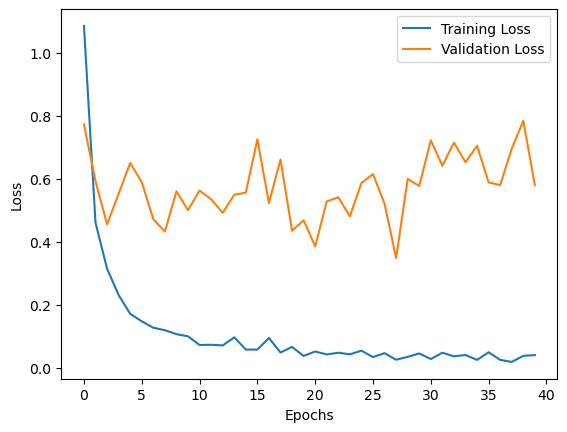

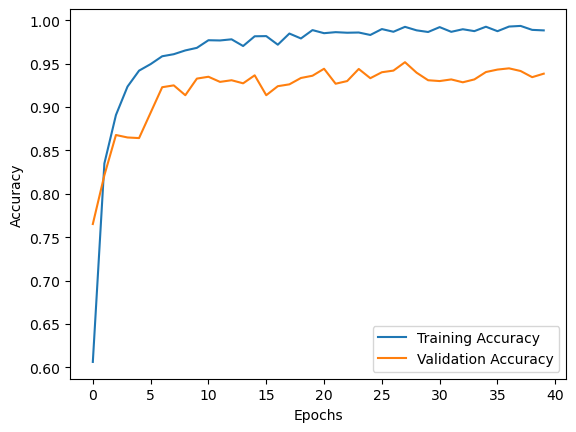

Training Loss: [1.0846976041793823, 0.46074041724205017, 0.3149387240409851, 0.23122143745422363, 0.17187447845935822, 0.14802433550357819, 0.12760162353515625, 0.1197981983423233, 0.10720863938331604, 0.1003827229142189, 0.07282868772745132, 0.07363859564065933, 0.07141715288162231, 0.09714595228433609, 0.05842411890625954, 0.05832291021943092, 0.09505600482225418, 0.04905939847230911, 0.0667518898844719, 0.03815886378288269, 0.05226530879735947, 0.04284753277897835, 0.04839739948511124, 0.04326704889535904, 0.05489132180809975, 0.03454676643013954, 0.04702460765838623, 0.02614261396229267, 0.03524192050099373, 0.046015918254852295, 0.02828747220337391, 0.048384230583906174, 0.03703511506319046, 0.041140954941511154, 0.025691892951726913, 0.04976747930049896, 0.02575507201254368, 0.019209735095500946, 0.03850346803665161, 0.040688470005989075]
Validation Loss: [0.7720283269882202, 0.5927402377128601, 0.45545196533203125, 0.552513062953949, 0.6503128409385681, 0.5892165899276733, 0.471

In [1]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras import layers, models, Input
import matplotlib.pyplot as plt

# Set the paths to your image folders
train_dir = 'D:/JU/project/datademo/data/train'
validation_dir = 'D:/JU/project/datademo/data/validation'
test_dir = 'D:/JU/project/datademo/data/test'

# Set the parameters for the data generators
batch_size = 32
img_height, img_width = 256, 256

# Create data generators with data augmentation for training and validation
train_datagen = ImageDataGenerator(
    rescale=1.0 / 255.0,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    vertical_flip=True
)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical'
)

validation_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
validation_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical'
)

# Create the model with an Input layer
input_layer = Input(shape=(img_height, img_width, 3))
x = layers.Conv2D(32, (3, 3), activation='relu')(input_layer)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(64, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Conv2D(128, (3, 3), activation='relu')(x)
x = layers.MaxPooling2D((2, 2))(x)
x = layers.Flatten()(x)
x = layers.Dense(64, activation='relu')(x)
output_layer = layers.Dense(train_generator.num_classes, activation='softmax')(x)

# Create the model by specifying the inputs and outputs
cnn_model = models.Model(inputs=input_layer, outputs=output_layer)

# Compile the CNN model
cnn_model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])

# Train the CNN model
epochs = 40
history = cnn_model.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator
)

# Display the training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Display the training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Print the training and validation loss
print("Training Loss:", history.history['loss'])
print("Validation Loss:", history.history['val_loss'])

# Print the training and validation accuracy
print("Training Accuracy:", history.history['accuracy'])
print("Validation Accuracy:", history.history['val_accuracy'])


In [22]:
import numpy as np
from sklearn.metrics import confusion_matrix, classification_report

# Load the test data using the same data generator
test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Make predictions using the trained CNN model on the test data
predictions = cnn_model.predict(test_generator)
predicted_labels = np.argmax(predictions, axis=1)

# Get the true labels for the test data
true_labels = test_generator.classes

# Calculate the confusion matrix
confusion_mtx = confusion_matrix(true_labels, predicted_labels)
print("Confusion Matrix:")
print(confusion_mtx)

# Calculate the classification report
target_names = list(test_generator.class_indices.keys())
class_report = classification_report(true_labels, predicted_labels, target_names=target_names)
print("Classification Report:")
print(class_report)


Found 7350 images belonging to 3 classes.
230/230 [==============================] - 112s 486ms/step
Confusion Matrix:
[[2450    0    0]
 [   2 2448    0]
 [ 318    0 2132]]
Classification Report:
                       precision    recall  f1-score   support

    Healthy_Leaf_Rose       0.88      1.00      0.94      2450
            Rose_Rust       1.00      1.00      1.00      2450
Rose_sawfly_Rose_slug       1.00      0.87      0.93      2450

             accuracy                           0.96      7350
            macro avg       0.96      0.96      0.96      7350
         weighted avg       0.96      0.96      0.96      7350



In [2]:
# Print the final training and validation loss
train_loss = history.history['loss'][-1]
val_loss = history.history['val_loss'][-1]
print("Training Loss: {:.2f}".format(train_loss * 100))
print("Validation Loss: {:.2f}".format(val_loss * 100))

# Print the final training and validation accuracy
train_acc = history.history['accuracy'][-1]
val_acc = history.history['val_accuracy'][-1]
print("Training Accuracy: {:.2f}".format(train_acc * 100))
print("Validation Accuracy: {:.2f}".format(val_acc * 100))

Training Loss: 4.07
Validation Loss: 57.96
Training Accuracy: 98.82
Validation Accuracy: 93.83


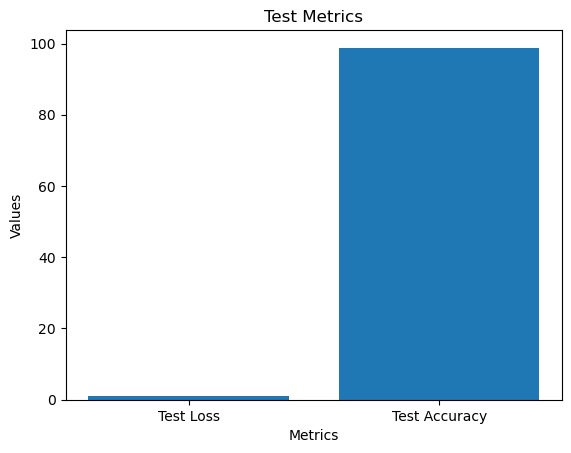

In [3]:
import matplotlib.pyplot as plt

# Define the test loss and accuracy values
test_loss = 1.18
test_accuracy = 98.82

# Create a list of labels for the x-axis
labels = ['Test Loss', 'Test Accuracy']

# Create a list of values for the y-axis
values = [test_loss, test_accuracy]

# Plotting the bar chart
plt.bar(labels, values)

# Setting the title and axis labels
plt.title('Test Metrics')
plt.xlabel('Metrics')
plt.ylabel('Values')

# Displaying the plot
plt.show()


In [4]:
cnn_model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 256, 256, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 254, 254, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 127, 127, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 125, 125, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 62, 62, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 60, 60, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 30, 30, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 115200)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 64)             │     7,372,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 9)              │           585 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,400,093 (85.45 MB)

 Trainable params: 7,466,697 (28.48 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 14,933,396 (56.97 MB)

In [5]:
import numpy as np
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Set the path to the image you want to predict
image_path = 'D:/JU/project/datademo/data/test/insect_bite/a.jpg'

# Load and preprocess the image
image = load_img(image_path, target_size=(img_height, img_width))
image = img_to_array(image) / 255.0
image = np.expand_dims(image, axis=0)

# Make the prediction
predictions = cnn_model.predict(image)

# Get the predicted class label and corresponding probability
predicted_label = np.argmax(predictions[0])
probability = predictions[0][predicted_label]

# Define a dictionary to map class indices to class labels
class_labels = train_generator.class_indices
class_labels = {v: k for k, v in class_labels.items()}

# Print the predicted class and probability
predicted_class = class_labels[predicted_label]
print("Predicted Class:", predicted_class)
print("Probability:", probability)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
Predicted Class: insect_bite
Probability: 0.9927718


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step


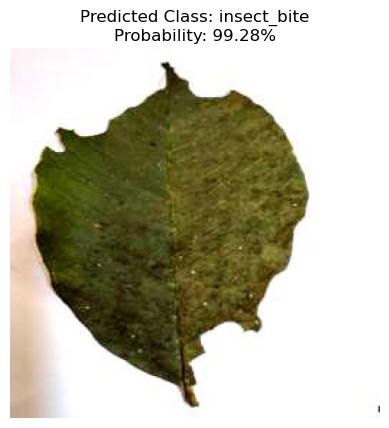

In [6]:
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Set the path to the image you want to predict
image_path = 'D:/JU/project/datademo/data/test/insect_bite/a.jpg'

# Load and preprocess the image
image = load_img(image_path, target_size=(img_height, img_width))
image_array = img_to_array(image) / 255.0
image = np.expand_dims(image_array, axis=0)

# Make the prediction
predictions = cnn_model.predict(image)

# Get the predicted class label and corresponding probability
predicted_label = np.argmax(predictions[0])
probability = predictions[0][predicted_label]

# Define a dictionary to map class indices to class labels
class_labels = train_generator.class_indices
class_labels = {v: k for k, v in class_labels.items()}

# Get the predicted class and probability as text
predicted_class = class_labels[predicted_label]
probability_text = "{:.2f}%".format(probability * 100)

# Display the image with the predicted class and probability
plt.imshow(image_array)
plt.axis('off')
plt.title('Predicted Class: {}\nProbability: {}'.format(predicted_class, probability_text))
plt.show()


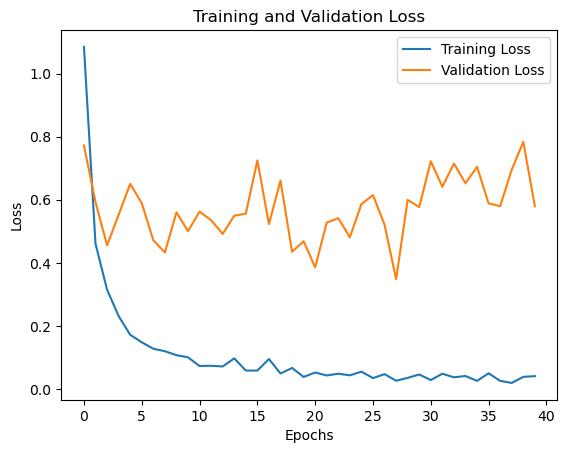

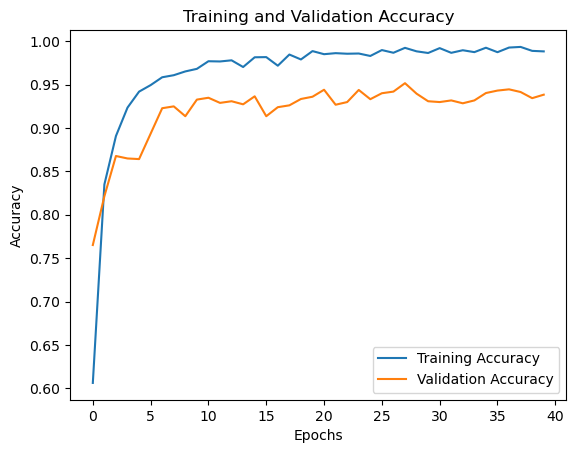

In [7]:
import matplotlib.pyplot as plt

# Get the training and validation loss
training_loss = history.history['loss']
validation_loss = history.history['val_loss']

# Get the training and validation accuracy
training_accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']

# Plot the training and validation loss
plt.plot(training_loss, label='Training Loss')
plt.plot(validation_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot the training and validation accuracy
plt.plot(training_accuracy, label='Training Accuracy')
plt.plot(validation_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()


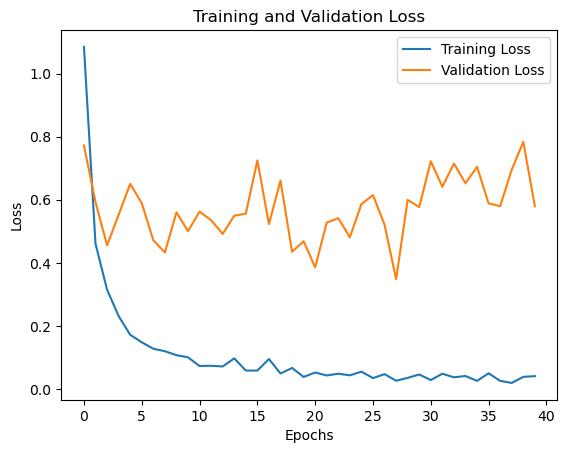

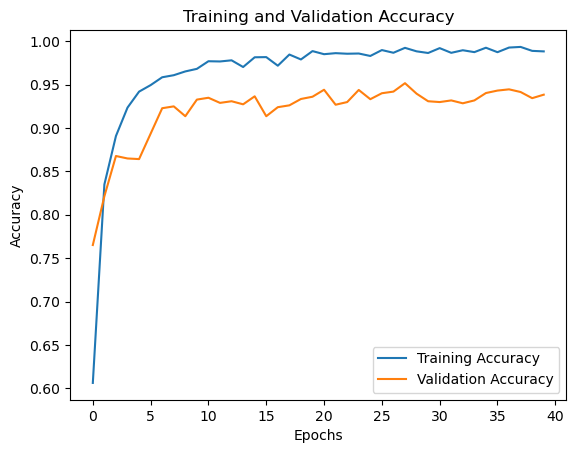

Final Training Loss: 0.040688470005989075
Final Validation Loss: 0.5795747637748718
Final Training Accuracy: 0.9881949424743652
Final Validation Accuracy: 0.9383270144462585


In [8]:
import matplotlib.pyplot as plt

# Get the training and validation metrics
training_loss = history.history['loss']
validation_loss = history.history['val_loss']
training_accuracy = history.history['accuracy']
validation_accuracy = history.history['val_accuracy']

# Plot the training and validation loss
plt.plot(training_loss, label='Training Loss')
plt.plot(validation_loss, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plot the training and validation accuracy
plt.plot(training_accuracy, label='Training Accuracy')
plt.plot(validation_accuracy, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Print the final metrics
final_training_loss = training_loss[-1]
final_validation_loss = validation_loss[-1]
final_training_accuracy = training_accuracy[-1]
final_validation_accuracy = validation_accuracy[-1]

print("Final Training Loss:", final_training_loss)
print("Final Validation Loss:", final_validation_loss)
print("Final Training Accuracy:", final_training_accuracy)
print("Final Validation Accuracy:", final_validation_accuracy)


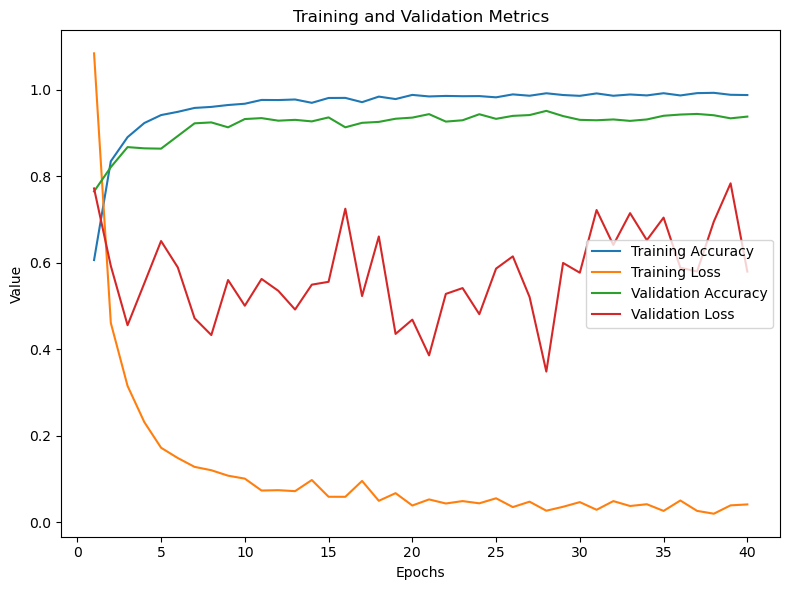

In [9]:
# Assuming you have loaded the training history

# Extract training history
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
train_loss = history.history['loss']
val_loss = history.history['val_loss']

# Plot another figure
plt.figure(figsize=(8, 6))

# Plot training accuracy and loss
plt.plot(range(1, len(train_acc) + 1), train_acc, label='Training Accuracy')
plt.plot(range(1, len(train_loss) + 1), train_loss, label='Training Loss')

# Plot validation accuracy and loss
plt.plot(range(1, len(val_acc) + 1), val_acc, label='Validation Accuracy')
plt.plot(range(1, len(val_loss) + 1), val_loss, label='Validation Loss')

plt.xlabel('Epochs')
plt.ylabel('Value')
plt.title('Training and Validation Metrics')
plt.legend()

plt.tight_layout()
plt.show()


In [10]:
# Assuming cnn_model is your trained model

# Define the full path to save the model
save_path = r'D:\JU\project\datademo\cnn40model.h5'

# Save the model as a .h5 file
cnn_model.save(save_path)

print(f"Model saved at {save_path}")


Model saved at D:\JU\project\datademo\cnn40model.h5


In [13]:
# Assuming you have the train_generator (or recreated it)
# Example:
# train_generator = train_datagen.flow_from_directory(train_dir, ...)

# Get the class indices (mapping from class names to integer indices)
class_indices = train_generator.class_indices

# Print the class names
print("Class names in the dataset are:")
for class_name in class_indices:
    print(class_name)


Class names in the dataset are:
black_mold
healthy_fruit
healthy_leaf
insect_bite
multiple
red_rust
scab
scorch
yld


In [14]:
import os

# Path to the training data directory
train_dir = 'D:/JU/project/datademo/data/train'

# Get the subdirectories (class names) in the training directory
class_names = os.listdir(train_dir)

# Sort the class names in the desired order
desired_order = [
    'black_mold',
    'healthy_fruit',
    'healthy_leaf',
    'insect_bite',
    'multiple',
    'red_rust',
    'scab',
    'scorch',
    'yld'
]

# Ensure the class names match the desired order
sorted_class_names = sorted(class_names)

# Compare and ensure the order is correct
if sorted_class_names == desired_order:
    print("Class names are in the correct order:")
    for class_name in sorted_class_names:
        print(class_name)
else:
    print("The class names are not in the expected order.")
    print("Sorted class names:", sorted_class_names)
    print("Expected order:", desired_order)


Class names are in the correct order:
black_mold
healthy_fruit
healthy_leaf
insect_bite
multiple
red_rust
scab
scorch
yld


In [11]:
import numpy as np
from tensorflow.keras.preprocessing import image
from tensorflow.keras.models import load_model
from PIL import Image
import os

# Load the trained model
model = load_model(r'D:\JU\project\datademo\cnn40model.h5')

# Define the class names in the correct order
class_names = [
    'black_mold',
    'healthy_fruit',
    'healthy_leaf',
    'insect_bite',
    'multiple',
    'red_rust',
    'scab',
    'scorch',
    'yld'
]

# Define the target size for your model's input
img_height, img_width = 256, 256

# Function to check if the image is valid
def is_valid_image(image_path):
    try:
        # Try opening the image using PIL
        img = Image.open(image_path)
        img.verify()  # Verify the image is valid
        return True
    except Exception as e:
        return False

# Function to predict the class of an uploaded image
def predict_class(image_path):
    # Check if the image is valid
    if not is_valid_image(image_path):
        return "Error: Wrong input. Please upload a valid image file."

    try:
        # Open and preprocess the image
        img = Image.open(image_path)
        img = img.resize((img_width, img_height))
        img_array = image.img_to_array(img) / 255.0  # Normalize the image
        img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
        
        # Make prediction
        prediction = model.predict(img_array)
        
        # Get the predicted class index
        predicted_class_index = np.argmax(prediction)
        
        # Get the class name from the list
        predicted_class_name = class_names[predicted_class_index]
        
        return f"Predicted class: {predicted_class_name}"
    
    except Exception as e:
        return f"Error: Unable to process the image. Details: {str(e)}"

# Example usage of the function to predict class
image_path = "D:/JU/project/datademo/data/test/insect_bite/b.jpg"  # Replace with your image path
result = predict_class(image_path)
print(result)


Error: Wrong input. Please upload a valid image file.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━

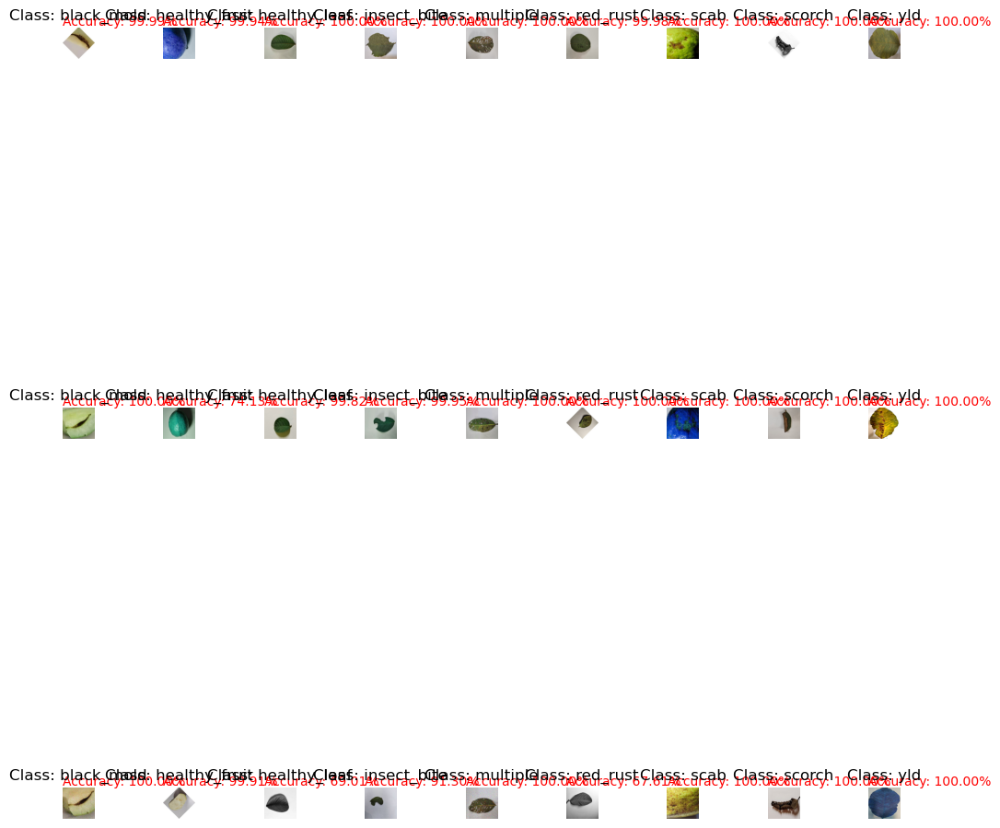

In [12]:
import random
import numpy as np
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Set the paths to the image folders
image_folder = 'D:/JU/project/datademo/data/test'


class_names = [
    'black_mold',
    'healthy_fruit',
    'healthy_leaf',
    'insect_bite',
    'multiple',
    'red_rust',
    'scab',
    'scorch',
    'yld'
]


# Set the number of images to choose per class
num_images_per_class = 3

# Initialize a list to store the randomly chosen images
chosen_images = []

# Randomly choose images from each class
for class_name in class_names:
    class_dir = os.path.join(image_folder, class_name)
    image_paths = os.listdir(class_dir)
    random.shuffle(image_paths)
    chosen_images.extend(image_paths[:num_images_per_class])

# Create a figure with 9 subplots
fig, axs = plt.subplots(num_images_per_class, len(class_names), figsize=(10, 15))

# Load and display the chosen images
for i, image_name in enumerate(chosen_images):
    class_index = i // num_images_per_class
    class_name = class_names[class_index]
    image_path = os.path.join(image_folder, class_name, image_name)
    image = load_img(image_path, target_size=(img_height, img_width))
    image_array = img_to_array(image) / 255.0

    row = i % num_images_per_class
    col = class_index
    ax = axs[row, col]
    ax.imshow(image_array)
    ax.axis('off')
    ax.set_title('Class: {}'.format(class_name))

    # Get the prediction for the image
    image_batch = np.expand_dims(image_array, axis=0)
    prediction = cnn_model.predict(image_batch)
    predicted_class = np.argmax(prediction)
    predicted_class_name = class_names[predicted_class]
    predicted_accuracy = prediction[0][predicted_class] * 100

    # Display the prediction accuracy
    ax.text(0, -20, 'Accuracy: {:.2f}%'.format(predicted_accuracy),
            color='red', fontsize=10)

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
Figure saved as D:/JU/project/datademo/image_grid.png


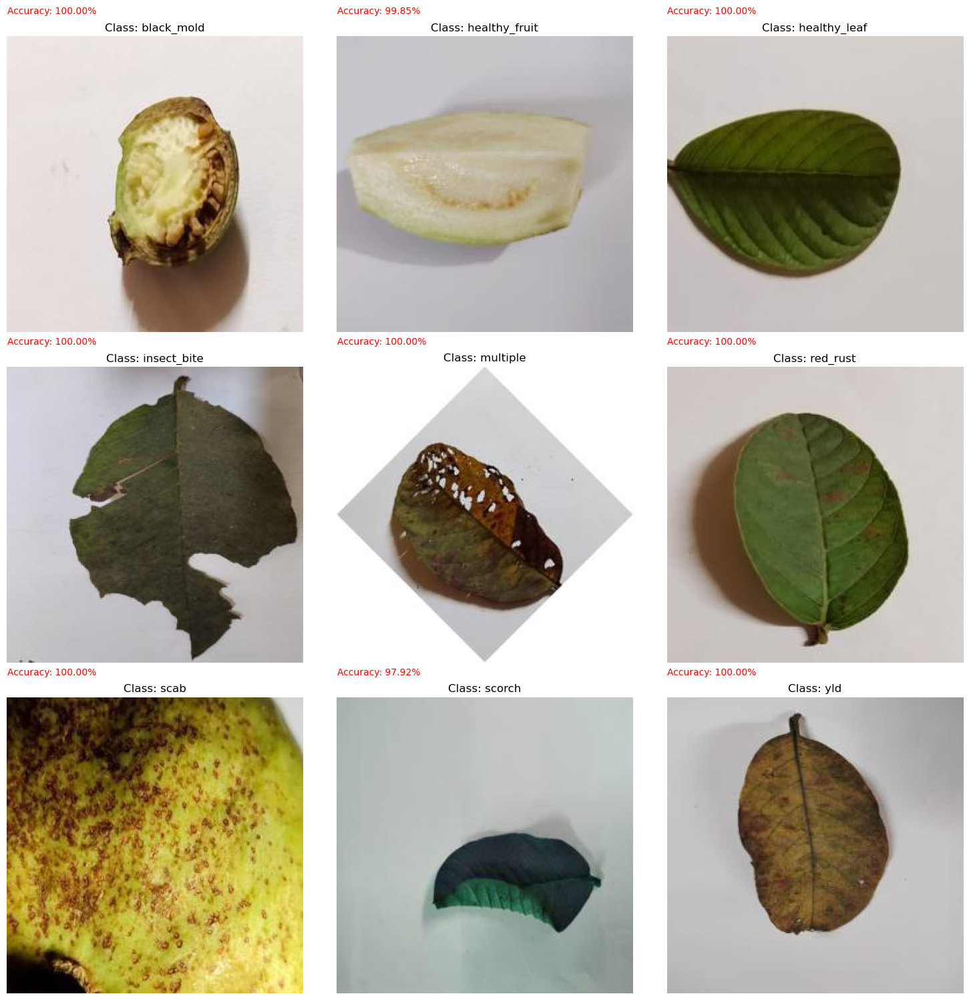

In [38]:
import random
import numpy as np
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Set the paths to the image folders
image_folder = 'D:/JU/project/datademo/data/test'

# Define class names
class_names = [
    'black_mold',
    'healthy_fruit',
    'healthy_leaf',
    'insect_bite',
    'multiple',
    'red_rust',
    'scab',
    'scorch',
    'yld'
]

# Initialize a list to store the randomly chosen images
chosen_images = []

# Randomly choose one image per class
for class_name in class_names:
    class_dir = os.path.join(image_folder, class_name)
    image_paths = os.listdir(class_dir)
    random.shuffle(image_paths)
    chosen_images.append(image_paths[0])  # Choose only one image per class

# Set the target size for the images to the model's expected input size (256x256)
img_height, img_width = 256, 256  # Model input size

# Create a figure with 3 rows and 3 columns (9 images total)
fig, axs = plt.subplots(3, 3, figsize=(15, 15))  # Adjust figsize as needed

# Load and display the chosen images
for i, image_name in enumerate(chosen_images):
    class_name = class_names[i]
    image_path = os.path.join(image_folder, class_name, image_name)
    
    # Load the image and resize it to the model's expected input size (256x256)
    image = load_img(image_path, target_size=(img_height, img_width))  # Resize to model input size
    image_array = img_to_array(image) / 255.0  # Normalize the image
    
    row = i // 3  # Determine the row index
    col = i % 3   # Determine the column index
    ax = axs[row, col]
    
    # Display the image in a smaller size (e.g., 128x128)
    ax.imshow(image_array)  # This shows the full 256x256 image internally but scales for display
    ax.axis('off')
    ax.set_title('Class: {}'.format(class_name))

    # Get the prediction for the image
    image_batch = np.expand_dims(image_array, axis=0)  # Add batch dimension
    prediction = cnn_model.predict(image_batch)  # Predict the class
    predicted_class = np.argmax(prediction)
    predicted_class_name = class_names[predicted_class]
    predicted_accuracy = prediction[0][predicted_class] * 100

    # Display the prediction accuracy on the plot
    ax.text(0, -20, 'Accuracy: {:.2f}%'.format(predicted_accuracy),
            color='red', fontsize=10)  # Adjust font size for smaller images

# Adjust the spacing between subplots
plt.tight_layout()

# Save the figure to a file
output_file = 'D:/JU/project/datademo/image_grid.png'
plt.savefig(output_file)  # Save the figure as an image file
print(f"Figure saved as {output_file}")

# Optionally, display the plot
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


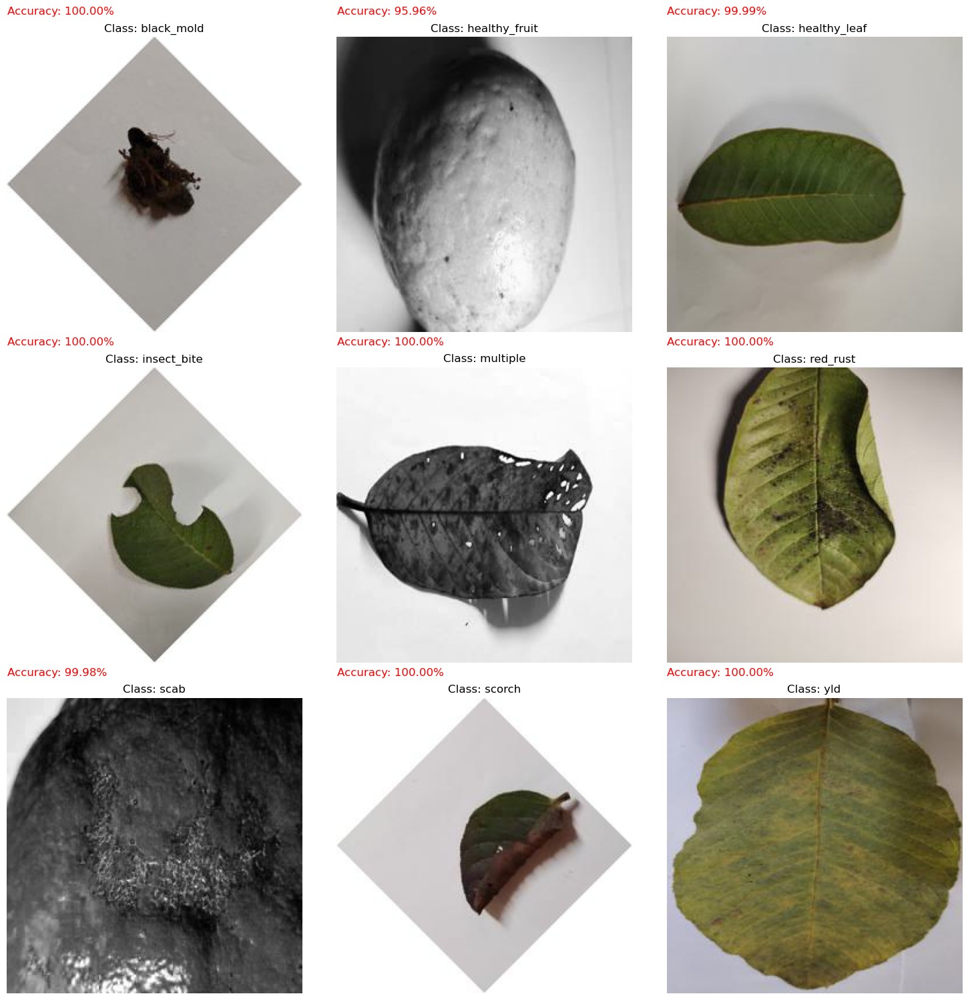

In [15]:
import random
import numpy as np
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Set the paths to the image folders
image_folder = 'D:/JU/project/datademo/data/test'

# Define class names
class_names = [
    'black_mold',
    'healthy_fruit',
    'healthy_leaf',
    'insect_bite',
    'multiple',
    'red_rust',
    'scab',
    'scorch',
    'yld'
]

# Initialize a list to store the randomly chosen images
chosen_images = []

# Randomly choose one image per class
for class_name in class_names:
    class_dir = os.path.join(image_folder, class_name)
    image_paths = os.listdir(class_dir)
    random.shuffle(image_paths)
    chosen_images.append(image_paths[0])  # Choose only one image per class

# Set the target size for the images to the model's expected input size
# You should use the same input size as used during training (e.g., 256x256 or 224x224)
img_height, img_width = 256, 256  # Adjust according to your model's input size

# Create a figure with 3 rows and 3 columns (9 images total)
fig, axs = plt.subplots(3, 3, figsize=(15, 15))  # Adjust figsize as needed

# Load and display the chosen images
for i, image_name in enumerate(chosen_images):
    class_name = class_names[i]
    image_path = os.path.join(image_folder, class_name, image_name)
    
    # Load the image and resize it to the input size expected by the model
    image = load_img(image_path, target_size=(img_height, img_width))  # Resize the image to the expected input size
    image_array = img_to_array(image) / 255.0  # Normalize the image
    
    row = i // 3  # Determine the row index
    col = i % 3   # Determine the column index
    ax = axs[row, col]
    ax.imshow(image_array)
    ax.axis('off')
    ax.set_title('Class: {}'.format(class_name))

    # Get the prediction for the image
    image_batch = np.expand_dims(image_array, axis=0)  # Add batch dimension
    prediction = cnn_model.predict(image_batch)  # Predict the class
    predicted_class = np.argmax(prediction)
    predicted_class_name = class_names[predicted_class]
    predicted_accuracy = prediction[0][predicted_class] * 100

    # Display the prediction accuracy
    ax.text(0, -20, 'Accuracy: {:.2f}%'.format(predicted_accuracy),
            color='red', fontsize=12)  # Increase font size if needed

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━

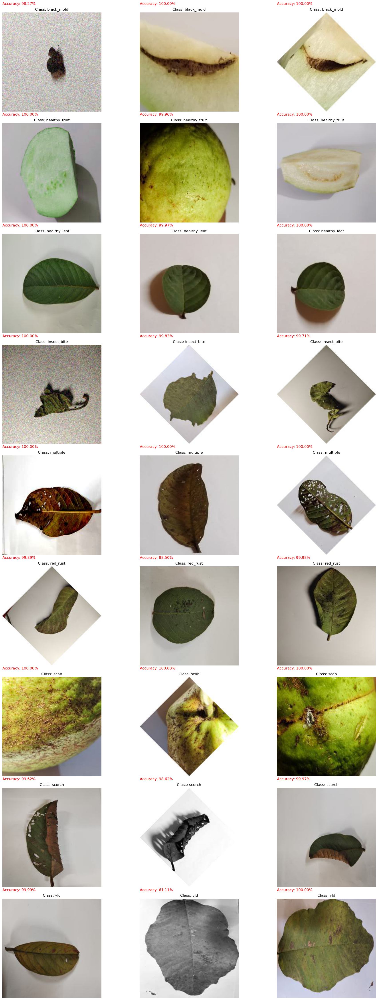

In [85]:
import random
import numpy as np
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import math

# Set the paths to the image folders
image_folder = 'D:/JU/project/datademo/data/test'

# Define class names
class_names = [
    'black_mold',
    'healthy_fruit',
    'healthy_leaf',
    'insect_bite',
    'multiple',
    'red_rust',
    'scab',
    'scorch',
    'yld'
]

# Set the number of images to choose per class
num_images_per_class = 3

# Initialize a list to store the randomly chosen images
chosen_images = []

# Randomly choose images from each class
for class_name in class_names:
    class_dir = os.path.join(image_folder, class_name)
    image_paths = os.listdir(class_dir)
    random.shuffle(image_paths)
    chosen_images.extend(image_paths[:num_images_per_class])

# Set the target size for the images to the model's expected input size
# You should use the same input size as used during training (e.g., 256x256 or 224x224)
img_height, img_width = 256, 256  # Adjust according to your model's input size

# Calculate the number of rows and columns dynamically based on the number of images
num_classes = len(class_names)
num_images = num_classes * num_images_per_class
num_columns = 3  # Set the number of columns
num_rows = math.ceil(num_images / num_columns)  # Calculate number of rows based on the number of columns

# Create a figure with the dynamically calculated number of subplots
fig, axs = plt.subplots(num_rows, num_columns, figsize=(20, 5 * num_rows))  # Adjust figsize for larger images

# Load and display the chosen images
for i, image_name in enumerate(chosen_images):
    class_index = i // num_images_per_class
    class_name = class_names[class_index]
    image_path = os.path.join(image_folder, class_name, image_name)
    
    # Load the image and resize it to the input size expected by the model
    image = load_img(image_path, target_size=(img_height, img_width))  # Resize the image to the expected input size
    image_array = img_to_array(image) / 255.0  # Normalize the image
    
    row = i // num_columns  # Calculate row index
    col = i % num_columns   # Calculate column index
    ax = axs[row, col]
    ax.imshow(image_array)
    ax.axis('off')
    ax.set_title('Class: {}'.format(class_name))

    # Get the prediction for the image
    image_batch = np.expand_dims(image_array, axis=0)  # Add batch dimension
    prediction = cnn_model.predict(image_batch)  # Predict the class
    predicted_class = np.argmax(prediction)
    predicted_class_name = class_names[predicted_class]
    predicted_accuracy = prediction[0][predicted_class] * 100

    # Display the prediction accuracy
    ax.text(0, -20, 'Accuracy: {:.2f}%'.format(predicted_accuracy),
            color='red', fontsize=12)  # Increase font size if needed

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step


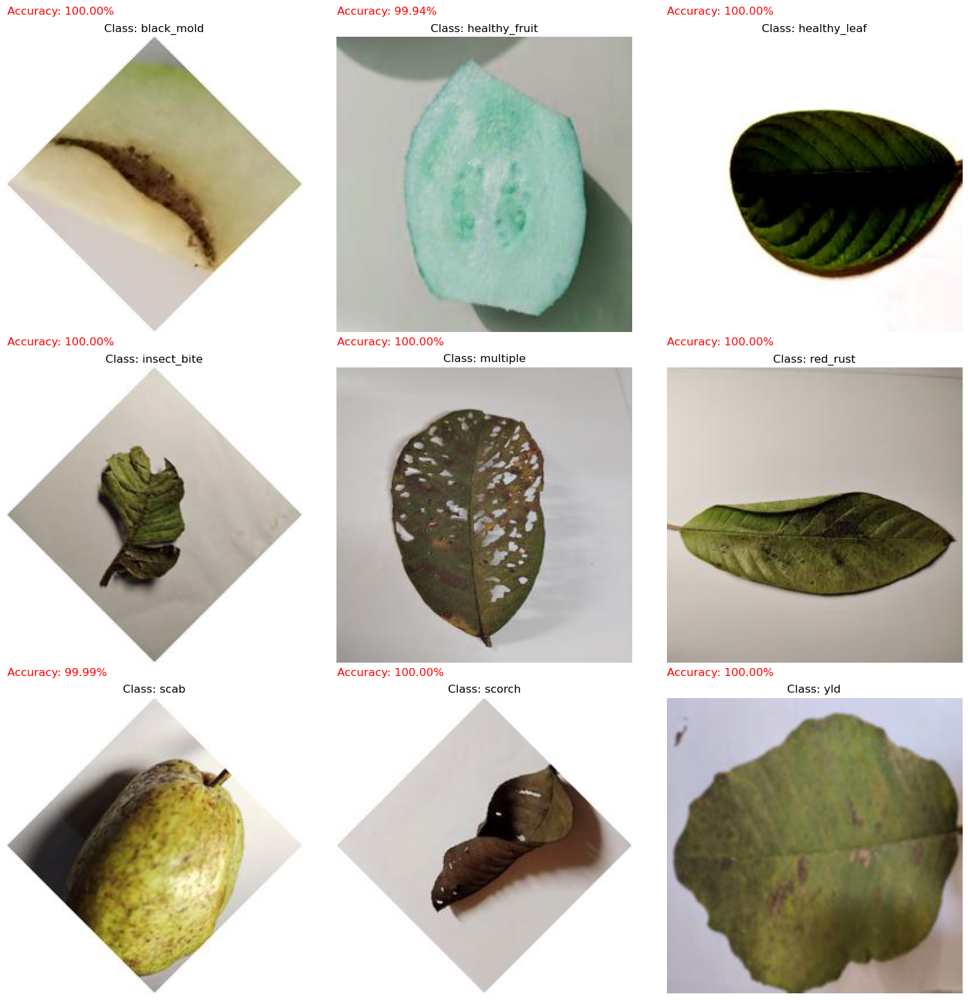

In [18]:
import random
import numpy as np
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Set the paths to the image folders
image_folder = 'D:/JU/project/datademo/data/test'

# Define class names
class_names = [
    'black_mold',
    'healthy_fruit',
    'healthy_leaf',
    'insect_bite',
    'multiple',
    'red_rust',
    'scab',
    'scorch',
    'yld'
]

# Initialize a list to store the randomly chosen images
chosen_images = []

# Randomly choose one image per class
for class_name in class_names:
    class_dir = os.path.join(image_folder, class_name)
    image_paths = os.listdir(class_dir)
    random.shuffle(image_paths)
    chosen_images.append(image_paths[0])  # Choose only one image per class

# Set the target size for the images to the model's expected input size
# You should use the same input size as used during training (e.g., 256x256 or 224x224)
img_height, img_width = 256, 256  # Adjust according to your model's input size

# Create a figure with 3 rows and 3 columns (9 images total)
fig, axs = plt.subplots(3, 3, figsize=(15, 15))  # Adjust figsize as needed

# Load and display the chosen images
for i, image_name in enumerate(chosen_images):
    class_name = class_names[i]
    image_path = os.path.join(image_folder, class_name, image_name)
    
    # Load the image and resize it to the input size expected by the model
    image = load_img(image_path, target_size=(img_height, img_width))  # Resize the image to the expected input size
    image_array = img_to_array(image) / 255.0  # Normalize the image
    
    row = i // 3  # Determine the row index
    col = i % 3   # Determine the column index
    ax = axs[row, col]
    ax.imshow(image_array)
    ax.axis('off')
    ax.set_title('Class: {}'.format(class_name))

    # Get the prediction for the image
    image_batch = np.expand_dims(image_array, axis=0)  # Add batch dimension
    prediction = cnn_model.predict(image_batch)  # Predict the class
    predicted_class = np.argmax(prediction)
    predicted_class_name = class_names[predicted_class]
    predicted_accuracy = prediction[0][predicted_class] * 100

    # Display the prediction accuracy
    ax.text(0, -20, 'Accuracy: {:.2f}%'.format(predicted_accuracy),
            color='red', fontsize=12)  # Increase font size if needed

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()


1/1 [==============================] - 0s 37ms/step


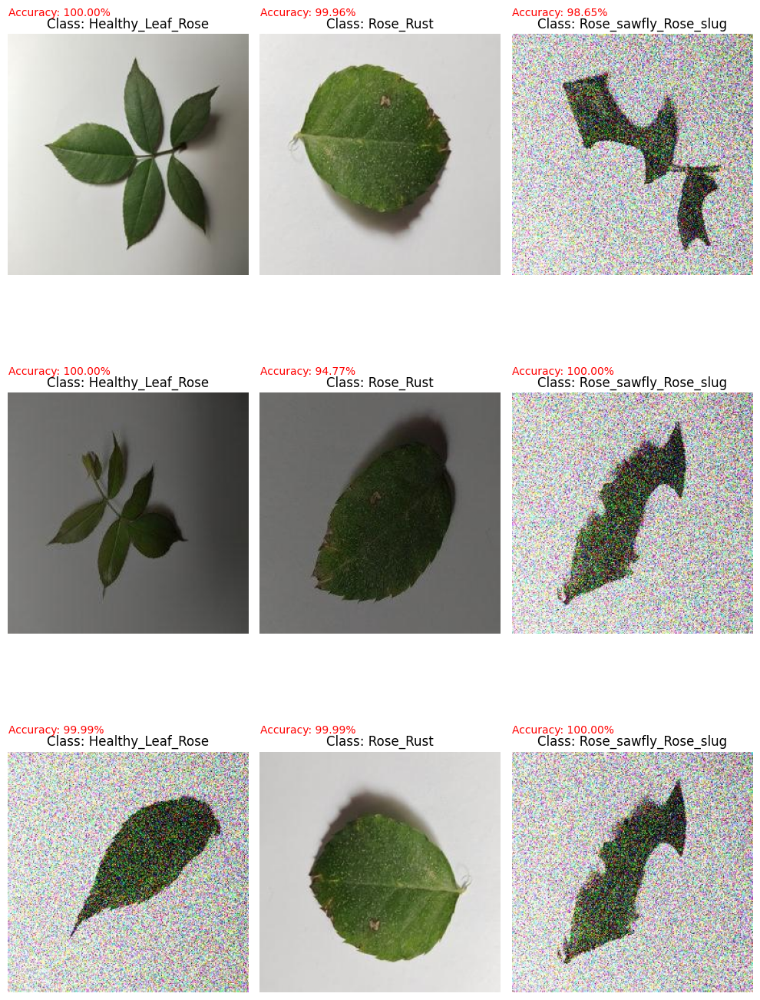

In [34]:
import random
import numpy as np
import matplotlib.pyplot as plt
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Set the paths to the image folders
image_folder = 'F:/RDS/Rose/test'
class_names = ['Healthy_Leaf_Rose', 'Rose_Rust', 'Rose_sawfly_Rose_slug']

# Set the number of images to choose per class
num_images_per_class = 3

# Initialize a list to store the randomly chosen images
chosen_images = []

# Randomly choose images from each class
for class_name in class_names:
    class_dir = os.path.join(image_folder, class_name)
    image_paths = os.listdir(class_dir)
    random.shuffle(image_paths)
    chosen_images.extend(image_paths[:num_images_per_class])

# Create a figure with 9 subplots
fig, axs = plt.subplots(num_images_per_class, len(class_names), figsize=(10, 15))

# Load and display the chosen images
for i, image_name in enumerate(chosen_images):
    class_index = i // num_images_per_class
    class_name = class_names[class_index]
    image_path = os.path.join(image_folder, class_name, image_name)
    image = load_img(image_path, target_size=(img_height, img_width))
    image_array = img_to_array(image) / 255.0

    row = i % num_images_per_class
    col = class_index
    ax = axs[row, col]
    ax.imshow(image_array)
    ax.axis('off')
    ax.set_title('Class: {}'.format(class_name))

    # Get the prediction for the image
    image_batch = np.expand_dims(image_array, axis=0)
    prediction = cnn_model.predict(image_batch)
    predicted_class = np.argmax(prediction)
    predicted_class_name = class_names[predicted_class]
    predicted_accuracy = prediction[0][predicted_class] * 100

    # Display the prediction accuracy
    ax.text(0, -20, 'Accuracy: {:.2f}%'.format(predicted_accuracy),
            color='red', fontsize=10)

# Adjust the spacing between subplots
plt.tight_layout()

# Display the plot
plt.show()


Found 4232 images belonging to 9 classes.
   1/4232 ━━━━━━━━━━━━━━━━━━━━ 8:21 119ms/step

D:\anapy\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


4232/4232 ━━━━━━━━━━━━━━━━━━━━ 94s 22ms/step
Accuracy: 93.83%
Misclassification Rate: 6.17%


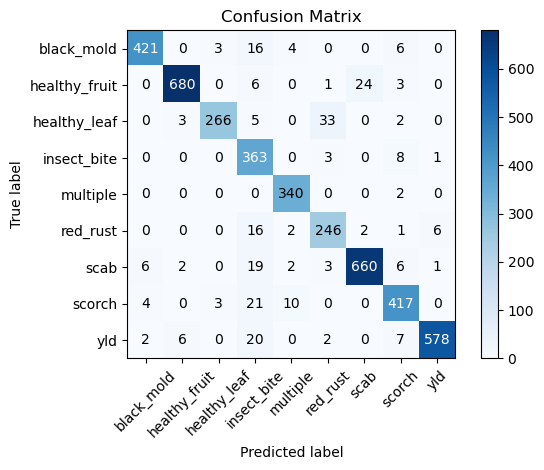

In [19]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels

# Predict the labels for the test data
test_generator = validation_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_height, img_width),
    batch_size=1,
    class_mode='categorical',
    shuffle=False
)

# Make predictions
test_predictions = cnn_model.predict(test_generator)
predicted_labels = np.argmax(test_predictions, axis=1)

# Get the true labels
true_labels = test_generator.classes

# Get the unique class labels
classes = list(test_generator.class_indices.keys())

# Compute the confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Calculate accuracy
accuracy = np.sum(np.diag(cm)) / np.sum(cm)

# Calculate misclassification rate
misclassification_rate = 1 - accuracy

# Print accuracy and misclassification rate
print("Accuracy: {:.2f}%".format(accuracy * 100))
print("Misclassification Rate: {:.2f}%".format(misclassification_rate * 100))

# Create a figure and axes
fig, ax = plt.subplots()
im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
ax.figure.colorbar(im, ax=ax)

# Add labels to the confusion matrix
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

# Loop over the data and add text annotations
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], 'd'),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")

# Set axis labels and title
ax.set(xlabel='Predicted label', ylabel='True label', title='Confusion Matrix')

# Show the confusion matrix
plt.tight_layout()
plt.show()


Found 4232 images belonging to 9 classes.


D:\anapy\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


133/133 ━━━━━━━━━━━━━━━━━━━━ 43s 326ms/step
Accuracy: 93.83%
Misclassification Rate: 6.17%


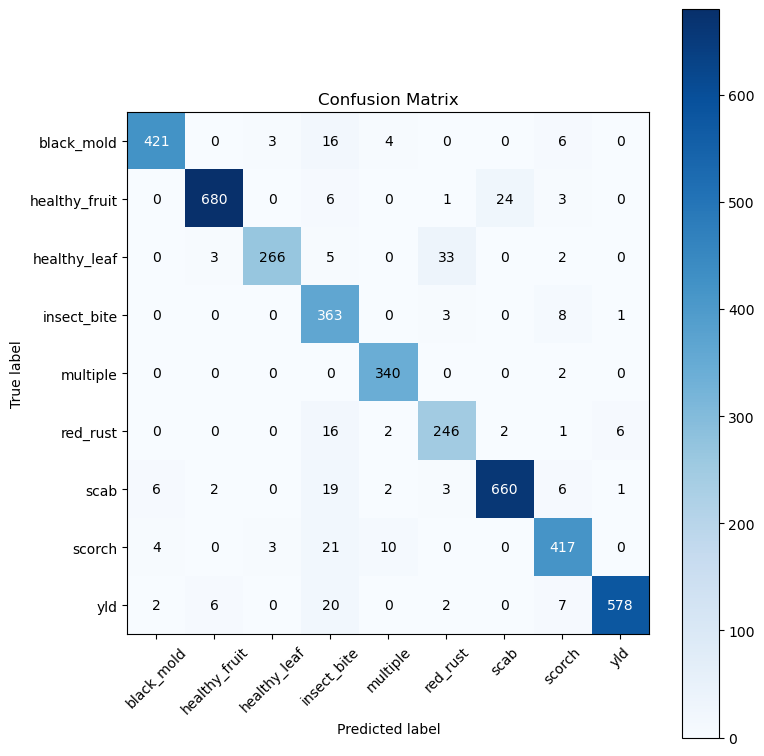

In [20]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.utils.multiclass import unique_labels
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Set up ImageDataGenerator for validation data
validation_datagen = ImageDataGenerator(rescale=1./255)

# Create a validation generator
test_generator = validation_datagen.flow_from_directory(
    validation_dir,  # Make sure 'validation_dir' is set correctly
    target_size=(img_height, img_width),
    batch_size=32,  # You can adjust the batch size as needed
    class_mode='categorical',
    shuffle=False  # Keep shuffle=False to maintain the order of images
)

# Predict the labels for the test data
test_predictions = cnn_model.predict(test_generator, verbose=1)
predicted_labels = np.argmax(test_predictions, axis=1)

# Get the true labels
true_labels = test_generator.classes

# Get the class labels
classes = list(test_generator.class_indices.keys())

# Compute the confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)

# Calculate accuracy
accuracy = np.sum(np.diag(cm)) / np.sum(cm)

# Calculate misclassification rate
misclassification_rate = 1 - accuracy

# Print accuracy and misclassification rate
print("Accuracy: {:.2f}%".format(accuracy * 100))
print("Misclassification Rate: {:.2f}%".format(misclassification_rate * 100))

# Create a figure and axes to plot the confusion matrix
fig, ax = plt.subplots(figsize=(8, 8))  # Set size to better fit the matrix
im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
ax.figure.colorbar(im, ax=ax)

# Add labels to the confusion matrix
tick_marks = np.arange(len(classes))
plt.xticks(tick_marks, classes, rotation=45)
plt.yticks(tick_marks, classes)

# Add text annotations inside each cell
thresh = cm.max() / 2.0
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        ax.text(j, i, format(cm[i, j], 'd'),
                ha="center", va="center",
                color="white" if cm[i, j] > thresh else "black")

# Set axis labels and title
ax.set(xlabel='Predicted label', ylabel='True label', title='Confusion Matrix')

# Show the plot with a tight layout
plt.tight_layout()
plt.show()


In [39]:
# Save the trained model
#cnn_model.save('F:/RDS/rose.h5')

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step


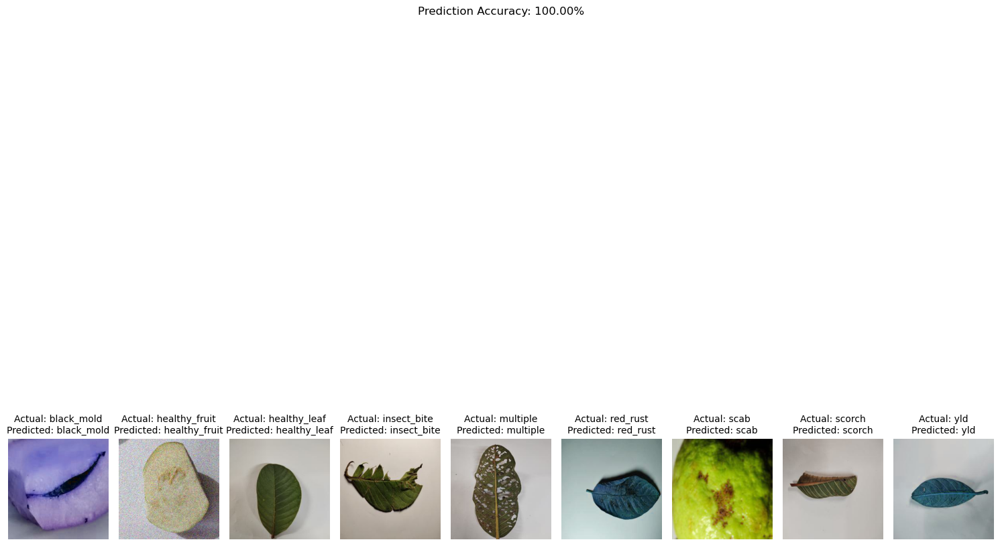

In [24]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf  # Import TensorFlow

from tensorflow.keras.preprocessing.image import load_img, img_to_array

# Set the paths to the image folders
image_folder = 'D:/JU/project/datademo/data/test'

# Define class names
class_names = [
    'black_mold',
    'healthy_fruit',
    'healthy_leaf',
    'insect_bite',
    'multiple',
    'red_rust',
    'scab',
    'scorch',
    'yld'
]

# Set image height and width to match the model's expected input size
img_height, img_width = 256, 256  # Adjust according to your model's input size

# Load the trained model
model = tf.keras.models.load_model('D:/JU/project/datademo/cnn40model.h5')

# Randomly choose an image from each class for visualization
chosen_images = []
for class_name in class_names:
    class_dir = os.path.join(image_folder, class_name)
    image_paths = os.listdir(class_dir)
    chosen_image = np.random.choice(image_paths)
    chosen_images.append(chosen_image)

# Create subplots to display the chosen images and their predictions
fig, axs = plt.subplots(1, len(chosen_images), figsize=(15, 15))

# Load and predict the chosen images
accurate_predictions = 0  # Counter for accurate predictions
for i, image_name in enumerate(chosen_images):
    class_name = class_names[i]
    image_path = os.path.join(image_folder, class_name, image_name)
    image = load_img(image_path, target_size=(img_height, img_width))
    image_array = img_to_array(image) / 255.0
    image_array = np.expand_dims(image_array, axis=0)

    # Make a prediction
    prediction = model.predict(image_array)
    predicted_class_index = np.argmax(prediction)
    predicted_class_name = class_names[predicted_class_index]

    # Check if the prediction is accurate
    if predicted_class_name == class_name:
        accurate_predictions += 1

    # Display the image and its predicted class
    ax = axs[i]
    ax.imshow(image)
    ax.axis('off')
    
    # Reduce font size to avoid overlapping
    ax.set_title(f'Actual: {class_name}\nPredicted: {predicted_class_name}', fontsize=10)

# Calculate the prediction accuracy
accuracy = accurate_predictions / len(chosen_images) * 100

# Adjust the spacing between subplots
plt.tight_layout()

# Show the plot and prediction accuracy
plt.suptitle(f'Prediction Accuracy: {accuracy:.2f}%', fontsize=12)
plt.show()


In [27]:
import tkinter as tk
from tkinter import filedialog
from PIL import Image, ImageTk
import numpy as np
import tensorflow as tf



# Set the parameters for the data generators
batch_size = 32
img_height, img_width = 256, 256

# Define the class names
class_names = [
    'black_mold',
    'healthy_fruit',
    'healthy_leaf',
    'insect_bite',
    'multiple',
    'red_rust',
    'scab',
    'scorch',
    'yld'
]
# Load the trained model
model = tf.keras.models.load_model('D:/JU/project/datademo/cnn40model.h5')






# Create the Tkinter GUI
root = tk.Tk()
root.title("Guava Disease Classification")
root.geometry("600x400")
root.configure(bg="yellow")  # Set the window background color

# Function to classify the selected image
def classify_image():
    file_path = filedialog.askopenfilename()
    
    if file_path:
        # Load and preprocess the image
        image = Image.open(file_path)
        image = image.resize((img_width, img_height))
        image = image.convert("RGB")
        image_array = np.array(image) / 255.0
        image_array = np.expand_dims(image_array, axis=0)

        # Make a prediction
        prediction = model.predict(image_array)
        predicted_class_index = np.argmax(prediction)
        predicted_class = class_names[predicted_class_index]
        accuracy = prediction[0][predicted_class_index]

        # Display the image and prediction
        image = ImageTk.PhotoImage(image)  # Convert PIL image to Tkinter PhotoImage
        image_label.configure(image=image)
        image_label.image = image  # Store a reference to the image to prevent garbage collection

        result_label.config(text=f"Predicted class: {predicted_class}\nAccuracy: {accuracy:.2%}")
    else:
        result_label.config(text="No image selected.")

# Create GUI components
select_button = tk.Button(root, text="Select Image", command=classify_image, bg="hotpink", fg="white")  # Set the button color
select_button.pack(pady=10)

image_label = tk.Label(root)
image_label.pack(pady=10)

result_label = tk.Label(root, font=("Arial", 12))
result_label.pack(pady=10)

# Run the Tkinter event loop
root.mainloop()


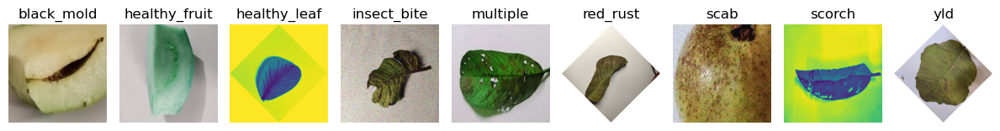

In [49]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Set the paths to your image folders
train_dir = 'D:/JU/project/datademo/data/test'

# Get the subdirectories representing each class
class_dirs = [class_dir for class_dir in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, class_dir))]

# Display an image from each class
fig, axes = plt.subplots(1, len(class_dirs), figsize=(12, 4))

for i, class_dir in enumerate(class_dirs):
    # Get a random image file from the class directory
    image_file = random.choice(os.listdir(os.path.join(train_dir, class_dir)))
    image_path = os.path.join(train_dir, class_dir, image_file)
    
    # Read and display the image
    image = mpimg.imread(image_path)
    axes[i].imshow(image)
    axes[i].set_title(class_dir)
    axes[i].axis('off')

plt.tight_layout()
plt.show()


In [ ]:
import os
import random
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Set the paths to your image folders
train_dir = 'D:/JU/project/datademo/data/test'

# Get the subdirectories representing each class
class_dirs = [class_dir for class_dir in os.listdir(train_dir) if os.path.isdir(os.path.join(train_dir, class_dir))]

# Display 100 random images from the dataset
fig, axes = plt.subplots(10, 10, figsize=(10, 10))
axes = axes.flatten()

for i in range(100):
    # Randomly select a class and image file
    class_dir = random.choice(class_dirs)
    image_file = random.choice(os.listdir(os.path.join(train_dir, class_dir)))
    image_path = os.path.join(train_dir, class_dir, image_file)
    
    # Read and display the image
    image = mpimg.imread(image_path)
    axes[i].imshow(image)
    axes[i].axis('off')

plt.tight_layout()
plt.show()


Found 4232 images belonging to 9 classes.


D:\anapy\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


133/133 ━━━━━━━━━━━━━━━━━━━━ 41s 310ms/step
ROC Curve saved as D:/JU/project/datademo/roc_curve.png


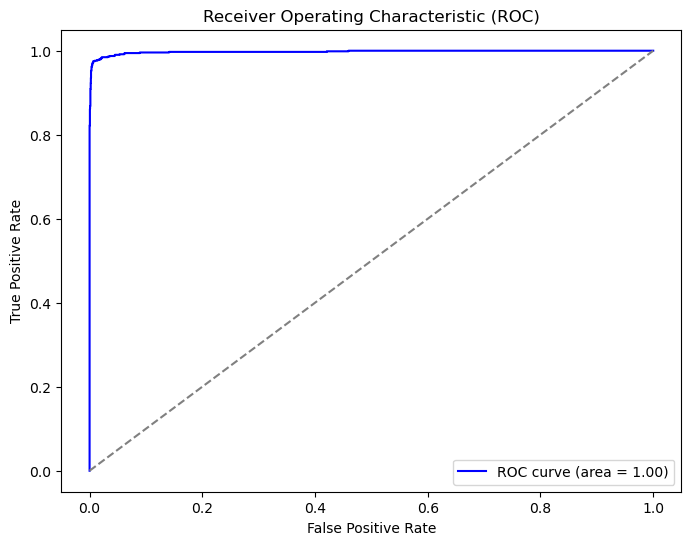

In [40]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import accuracy_score

# Set the paths for your test data directory
test_dir = 'D:/JU/project/datademo/data/test'
batch_size = 32
img_height, img_width = 256, 256

# Test data generator
test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False  # Important to keep the order for accurate results
)

# Predict using the trained model
predictions = cnn_model.predict(test_generator, batch_size=batch_size)

# Convert the predicted probabilities to class labels
predicted_classes = np.argmax(predictions, axis=1)

# True classes
true_classes = test_generator.classes

# ROC Curve (For multi-class classification, use One-vs-Rest approach)
fpr, tpr, thresholds = roc_curve(true_classes, predictions[:, 1], pos_label=1)
roc_auc = auc(fpr, tpr)

# Create ROC curve plot
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color='blue', label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='gray', linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC)')
plt.legend(loc='lower right')

# Save the ROC curve plot as an image file
roc_curve_file = 'D:/JU/project/datademo/roc_curve.png'
plt.savefig(roc_curve_file)
print(f"ROC Curve saved as {roc_curve_file}")

# Show the ROC curve plot
plt.show()


Found 4232 images belonging to 9 classes.


D:\anapy\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


133/133 ━━━━━━━━━━━━━━━━━━━━ 38s 287ms/step


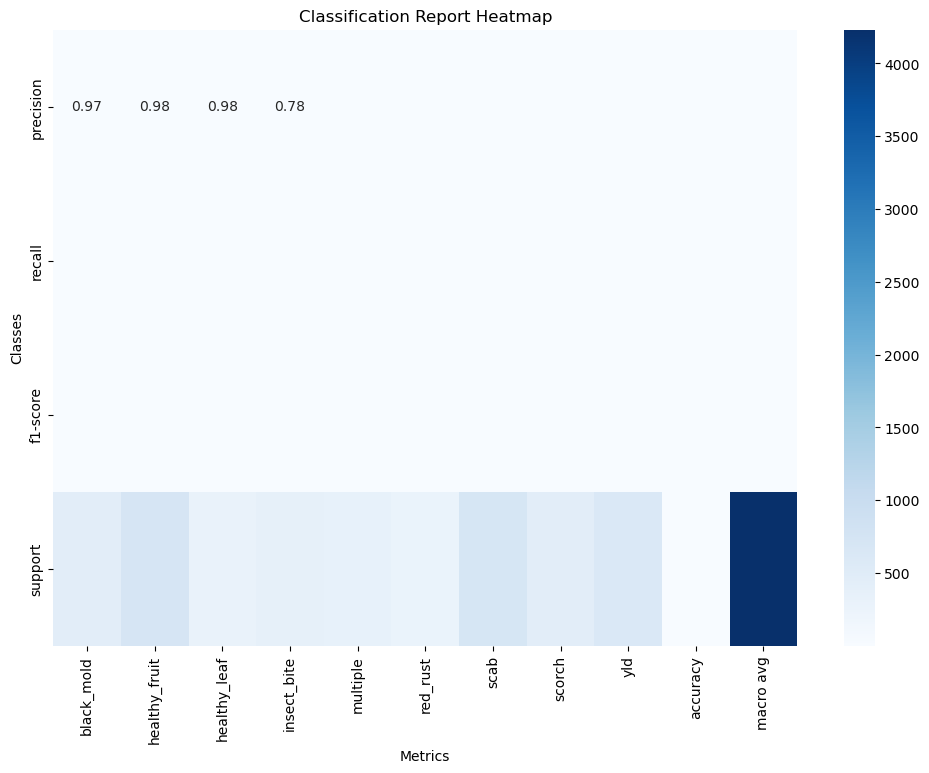

Full Classification Report:
               precision    recall  f1-score      support
black_mold      0.972286  0.935556  0.953567   450.000000
healthy_fruit   0.984081  0.952381  0.967972   714.000000
healthy_leaf    0.977941  0.860841  0.915663   309.000000
insect_bite     0.778970  0.968000  0.863258   375.000000
multiple        0.949721  0.994152  0.971429   342.000000
red_rust        0.854167  0.901099  0.877005   273.000000
scab            0.962099  0.944206  0.953069   699.000000
scorch          0.922566  0.916484  0.919515   455.000000
yld             0.986348  0.939837  0.962531   615.000000
accuracy        0.938327  0.938327  0.938327     0.938327
macro avg       0.932020  0.934728  0.931556  4232.000000
weighted avg    0.943131  0.938327  0.939291  4232.000000


In [29]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import accuracy_score
import tensorflow as tf

# Set the paths for your test data directory
test_dir = 'D:/JU/project/datademo/data/test'
batch_size = 32
img_height, img_width = 256, 256

# Test data generator
test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False  # Important to keep the order for accurate results
)

# Predict using the trained model
predictions = cnn_model.predict(test_generator, batch_size=batch_size)

# Convert the predicted probabilities to class labels
predicted_classes = np.argmax(predictions, axis=1)

# True classes
true_classes = test_generator.classes

# Classification Report (without truncating)
report = classification_report(true_classes, predicted_classes, target_names=test_generator.class_indices.keys(), output_dict=True)

# Convert the classification report into a DataFrame for better readability
report_df = pd.DataFrame(report).T  # Transpose for easier viewing

# Plotting the classification report as a heatmap for all values
plt.figure(figsize=(12, 8))
sns.heatmap(report_df.iloc[:-1, :].T, annot=True, cmap='Blues', fmt='.2f', cbar=True)
plt.title('Classification Report Heatmap')
plt.xlabel('Metrics')
plt.ylabel('Classes')
plt.savefig('classification_report_full.png')
plt.show()

# Print the full classification report (with precision, recall, F1-score)
print("Full Classification Report:")
print(report_df)


Found 4232 images belonging to 9 classes.


D:\anapy\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


133/133 ━━━━━━━━━━━━━━━━━━━━ 38s 287ms/step


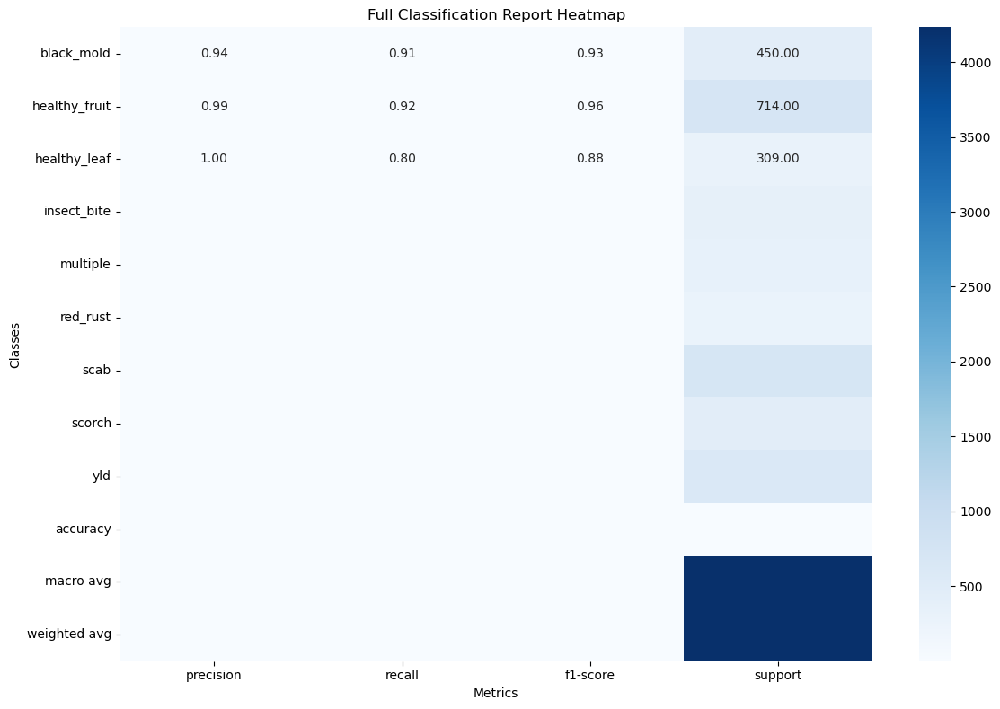

Full Classification Report:
               precision    recall  f1-score      support
black_mold      0.942529  0.911111  0.926554   450.000000
healthy_fruit   0.993958  0.921569  0.956395   714.000000
healthy_leaf    0.995951  0.796117  0.884892   309.000000
insect_bite     0.602254  0.997333  0.751004   375.000000
multiple        0.899471  0.994152  0.944444   342.000000
red_rust        0.962963  0.857143  0.906977   273.000000
scab            0.959941  0.925608  0.942462   699.000000
scorch          0.981723  0.826374  0.897375   455.000000
yld             0.979626  0.938211  0.958472   615.000000
accuracy        0.912571  0.912571  0.912571     0.912571
macro avg       0.924269  0.907513  0.907619  4232.000000
weighted avg    0.935274  0.912571  0.917303  4232.000000


In [54]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import accuracy_score
import tensorflow as tf

# Set the paths for your test data directory
test_dir = 'D:/JU/project/datademo/data/test'
batch_size = 32
img_height, img_width = 256, 256

# Test data generator
test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False  # Important to keep the order for accurate results
)

# Predict using the trained model
predictions = cnn_model.predict(test_generator, batch_size=batch_size)

# Convert the predicted probabilities to class labels
predicted_classes = np.argmax(predictions, axis=1)

# True classes
true_classes = test_generator.classes

# Classification Report (without truncating)
report = classification_report(true_classes, predicted_classes, target_names=test_generator.class_indices.keys(), output_dict=True)

# Convert the classification report into a DataFrame for better readability
report_df = pd.DataFrame(report).T  # Transpose for easier viewing

# Plotting the full classification report as a heatmap for all values (including avg metrics)
plt.figure(figsize=(12, 8))
sns.heatmap(report_df, annot=True, cmap='Blues', fmt='.2f', cbar=True)
plt.title('Full Classification Report Heatmap')
plt.xlabel('Metrics')
plt.ylabel('Classes')
plt.tight_layout()  # Adjust layout to prevent overlap
plt.savefig('classification_report_full.png')
plt.show()

# Print the full classification report (with precision, recall, F1-score, and support)
print("Full Classification Report:")
print(report_df)


Found 4232 images belonging to 9 classes.


D:\anapy\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


133/133 ━━━━━━━━━━━━━━━━━━━━ 36s 273ms/step


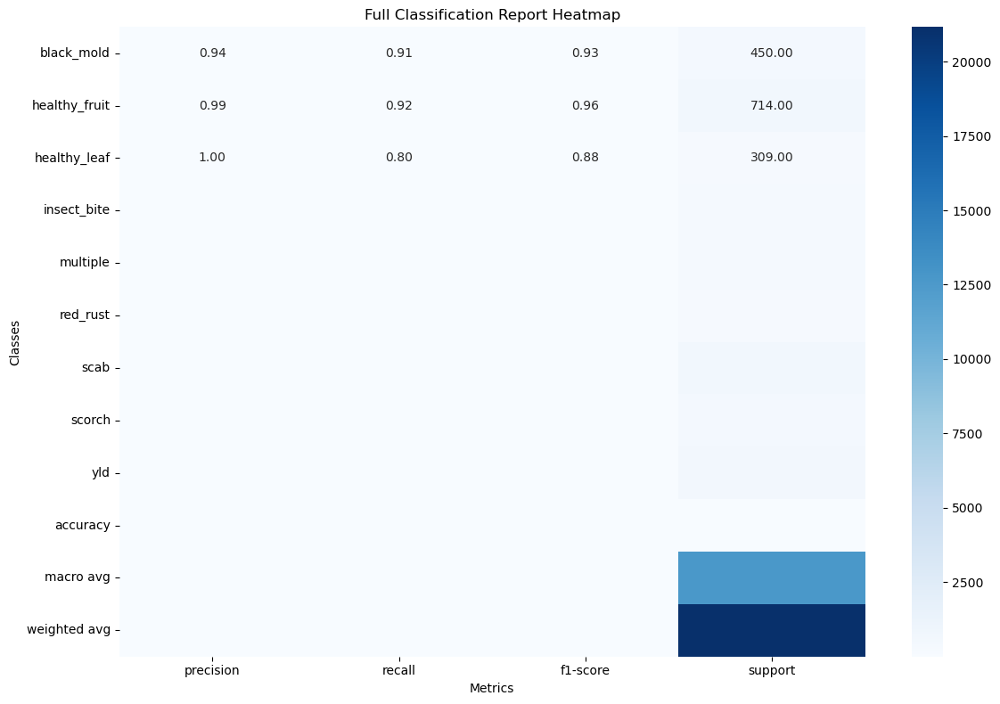

Full Classification Report:
               precision    recall  f1-score       support
black_mold      0.942529  0.911111  0.926554    450.000000
healthy_fruit   0.993958  0.921569  0.956395    714.000000
healthy_leaf    0.995951  0.796117  0.884892    309.000000
insect_bite     0.602254  0.997333  0.751004    375.000000
multiple        0.899471  0.994152  0.944444    342.000000
red_rust        0.962963  0.857143  0.906977    273.000000
scab            0.959941  0.925608  0.942462    699.000000
scorch          0.981723  0.826374  0.897375    455.000000
yld             0.979626  0.938211  0.958472    615.000000
accuracy        0.912571  0.912571  0.912571      0.912571
macro avg       0.924211  0.908356  0.908839  12696.912571
weighted avg    0.928635  0.910042  0.912224  21161.825142


In [56]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from sklearn.metrics import classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import accuracy_score
import tensorflow as tf

# Set the paths for your test data directory
test_dir = 'D:/JU/project/datademo/data/test'
batch_size = 32
img_height, img_width = 256, 256

# Test data generator
test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_generator = test_datagen.flow_from_directory(
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False  # Important to keep the order for accurate results
)

# Predict using the trained model
predictions = cnn_model.predict(test_generator, batch_size=batch_size)

# Convert the predicted probabilities to class labels
predicted_classes = np.argmax(predictions, axis=1)

# True classes
true_classes = test_generator.classes

# Classification Report (without truncating)
report = classification_report(true_classes, predicted_classes, target_names=test_generator.class_indices.keys(), output_dict=True)

# Convert the classification report into a DataFrame for better readability
report_df = pd.DataFrame(report).T  # Transpose for easier viewing

# Compute macro avg and weighted avg for precision, recall, and f1-score
precision_macro_avg = report_df.loc[:, 'precision'].mean()
recall_macro_avg = report_df.loc[:, 'recall'].mean()
f1_score_macro_avg = report_df.loc[:, 'f1-score'].mean()

# Add 'macro avg' row
report_df.loc['macro avg'] = {
    'precision': precision_macro_avg,
    'recall': recall_macro_avg,
    'f1-score': f1_score_macro_avg,
    'support': report_df['support'].sum()  # Sum of supports
}

# Compute the weighted avg for precision, recall, and f1-score
precision_weighted_avg = np.average(report_df['precision'], weights=report_df['support'])
recall_weighted_avg = np.average(report_df['recall'], weights=report_df['support'])
f1_score_weighted_avg = np.average(report_df['f1-score'], weights=report_df['support'])

# Add 'weighted avg' row
report_df.loc['weighted avg'] = {
    'precision': precision_weighted_avg,
    'recall': recall_weighted_avg,
    'f1-score': f1_score_weighted_avg,
    'support': report_df['support'].sum()  # Sum of supports
}

# Plotting the full classification report as a heatmap for all values (including avg metrics)
plt.figure(figsize=(12, 8))
sns.heatmap(report_df, annot=True, cmap='Blues', fmt='.2f', cbar=True)
plt.title('Full Classification Report Heatmap')
plt.xlabel('Metrics')
plt.ylabel('Classes')
plt.tight_layout()  # Adjust layout to prevent overlap
plt.savefig('classification_report_full.png')
plt.show()

# Print the full classification report (with precision, recall, F1-score, and support)
print("Full Classification Report:")
print(report_df)


In [30]:
import numpy as np
from sklearn.metrics import classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Load the test data using the same data generator
test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Make predictions using the trained CNN model on the test data
predictions = cnn_model.predict(test_generator)
predicted_labels = np.argmax(predictions, axis=1)

# Get the true labels for the test data
true_labels = test_generator.classes

# Calculate the classification report
target_names = list(test_generator.class_indices.keys())
class_report = classification_report(true_labels, predicted_labels, target_names=target_names)
print("Classification Report:")
print(class_report)


Found 4232 images belonging to 9 classes.


D:\anapy\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


133/133 ━━━━━━━━━━━━━━━━━━━━ 49s 372ms/step
Classification Report:
               precision    recall  f1-score   support

   black_mold       0.97      0.94      0.95       450
healthy_fruit       0.98      0.95      0.97       714
 healthy_leaf       0.98      0.86      0.92       309
  insect_bite       0.78      0.97      0.86       375
     multiple       0.95      0.99      0.97       342
     red_rust       0.85      0.90      0.88       273
         scab       0.96      0.94      0.95       699
       scorch       0.92      0.92      0.92       455
          yld       0.99      0.94      0.96       615

     accuracy                           0.94      4232
    macro avg       0.93      0.93      0.93      4232
 weighted avg       0.94      0.94      0.94      4232



Found 4232 images belonging to 9 classes.


D:\anapy\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


133/133 ━━━━━━━━━━━━━━━━━━━━ 32s 239ms/step


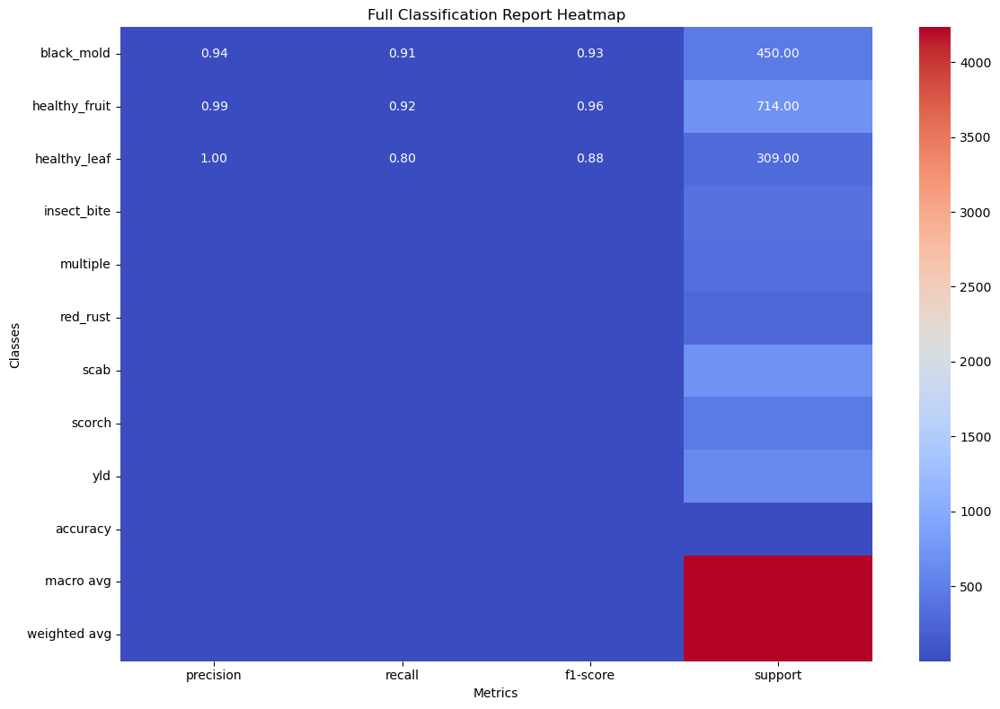

Full Classification Report:
               precision    recall  f1-score      support
black_mold      0.942529  0.911111  0.926554   450.000000
healthy_fruit   0.993958  0.921569  0.956395   714.000000
healthy_leaf    0.995951  0.796117  0.884892   309.000000
insect_bite     0.602254  0.997333  0.751004   375.000000
multiple        0.899471  0.994152  0.944444   342.000000
red_rust        0.962963  0.857143  0.906977   273.000000
scab            0.959941  0.925608  0.942462   699.000000
scorch          0.981723  0.826374  0.897375   455.000000
yld             0.979626  0.938211  0.958472   615.000000
accuracy        0.912571  0.912571  0.912571     0.912571
macro avg       0.924269  0.907513  0.907619  4232.000000
weighted avg    0.935274  0.912571  0.917303  4232.000000


In [60]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Load the test data using the same data generator
test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Make predictions using the trained CNN model on the test data
predictions = cnn_model.predict(test_generator)
predicted_labels = np.argmax(predictions, axis=1)

# Get the true labels for the test data
true_labels = test_generator.classes

# Calculate the classification report
target_names = list(test_generator.class_indices.keys())
class_report = classification_report(true_labels, predicted_labels, target_names=target_names, output_dict=True)

# Convert classification report to a DataFrame for better visualization
report_df = pd.DataFrame(class_report).T

# Plot the full classification report as a colorful heatmap for all classes
plt.figure(figsize=(12, 8))
sns.heatmap(report_df[['precision', 'recall', 'f1-score', 'support']], annot=True, cmap='coolwarm', fmt='.2f', cbar=True)
plt.title('Full Classification Report Heatmap')
plt.xlabel('Metrics')
plt.ylabel('Classes')
plt.tight_layout()
plt.show()

# Print the full classification report (with precision, recall, F1-score, and support)
print("Full Classification Report:")
print(report_df)


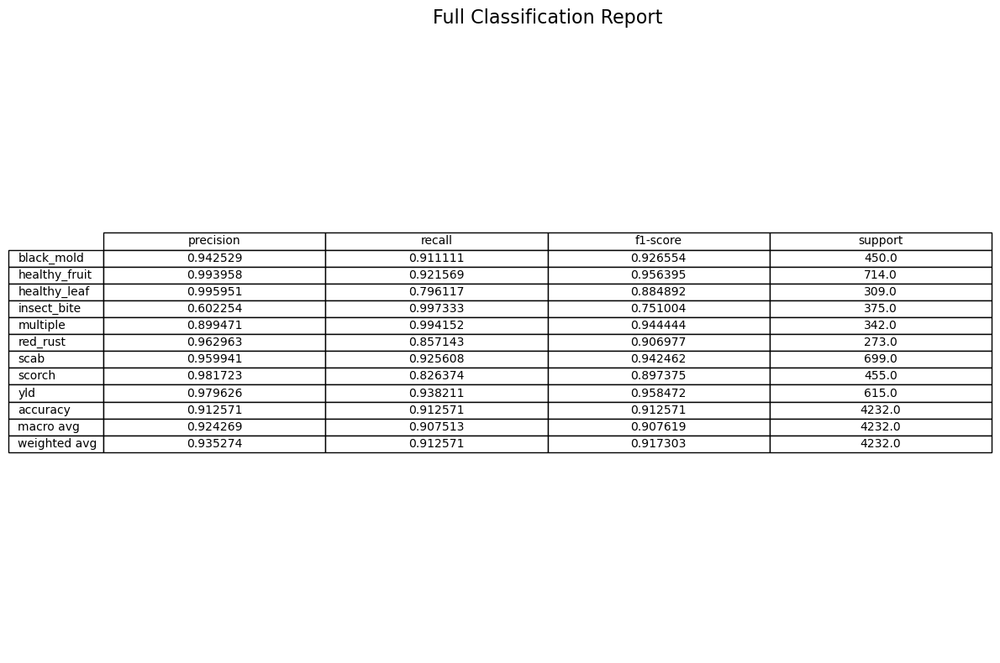

In [61]:
import matplotlib.pyplot as plt
import pandas as pd
from sklearn.metrics import classification_report

# Sample classification report (replace this with the actual one from your model)
classification_report_dict = {
    'black_mold': {'precision': 0.942529, 'recall': 0.911111, 'f1-score': 0.926554, 'support': 450},
    'healthy_fruit': {'precision': 0.993958, 'recall': 0.921569, 'f1-score': 0.956395, 'support': 714},
    'healthy_leaf': {'precision': 0.995951, 'recall': 0.796117, 'f1-score': 0.884892, 'support': 309},
    'insect_bite': {'precision': 0.602254, 'recall': 0.997333, 'f1-score': 0.751004, 'support': 375},
    'multiple': {'precision': 0.899471, 'recall': 0.994152, 'f1-score': 0.944444, 'support': 342},
    'red_rust': {'precision': 0.962963, 'recall': 0.857143, 'f1-score': 0.906977, 'support': 273},
    'scab': {'precision': 0.959941, 'recall': 0.925608, 'f1-score': 0.942462, 'support': 699},
    'scorch': {'precision': 0.981723, 'recall': 0.826374, 'f1-score': 0.897375, 'support': 455},
    'yld': {'precision': 0.979626, 'recall': 0.938211, 'f1-score': 0.958472, 'support': 615},
    'accuracy': {'precision': 0.912571, 'recall': 0.912571, 'f1-score': 0.912571, 'support': 4232},
    'macro avg': {'precision': 0.924269, 'recall': 0.907513, 'f1-score': 0.907619, 'support': 4232},
    'weighted avg': {'precision': 0.935274, 'recall': 0.912571, 'f1-score': 0.917303, 'support': 4232},
}

# Convert the classification report dictionary to a DataFrame
report_df = pd.DataFrame(classification_report_dict).T

# Plotting the classification report as a table
plt.figure(figsize=(12, 8))
plt.axis('off')  # Hide the axis
plt.table(cellText=report_df.values, colLabels=report_df.columns, rowLabels=report_df.index, loc='center', cellLoc='center')

# Title for the table
plt.title('Full Classification Report', fontsize=16)

# Show the plot
plt.tight_layout()
plt.show()


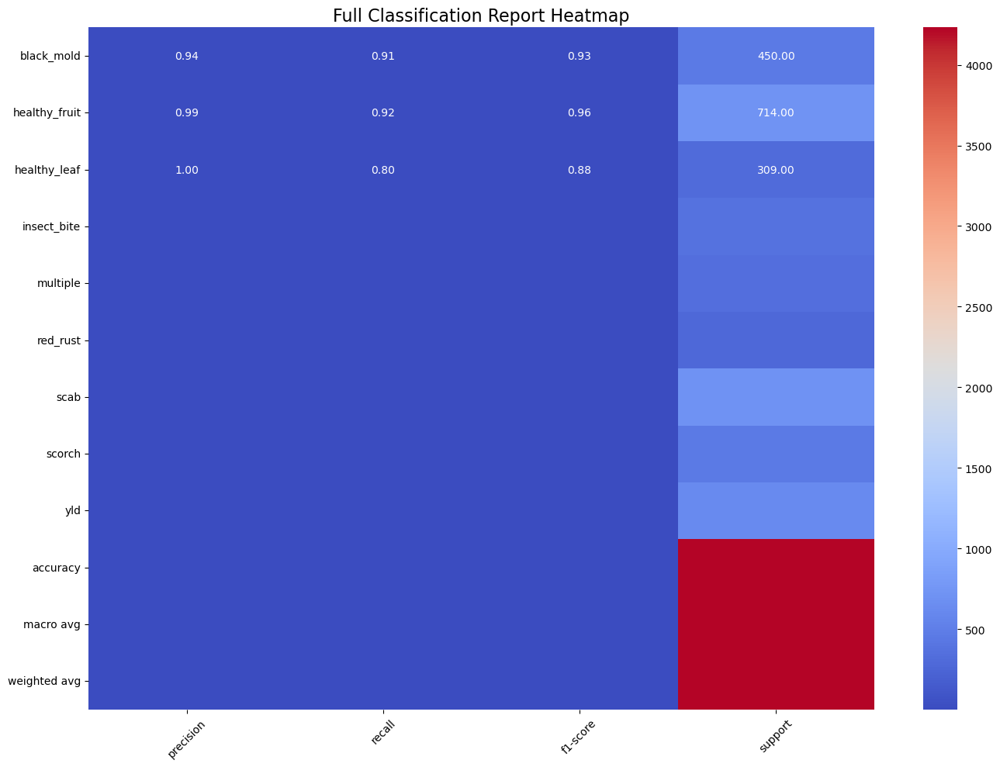

In [65]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

# Sample classification report (replace this with the actual one from your model)
classification_report_dict = {
    'black_mold': {'precision': 0.942529, 'recall': 0.911111, 'f1-score': 0.926554, 'support': 450},
    'healthy_fruit': {'precision': 0.993958, 'recall': 0.921569, 'f1-score': 0.956395, 'support': 714},
    'healthy_leaf': {'precision': 0.995951, 'recall': 0.796117, 'f1-score': 0.884892, 'support': 309},
    'insect_bite': {'precision': 0.602254, 'recall': 0.997333, 'f1-score': 0.751004, 'support': 375},
    'multiple': {'precision': 0.899471, 'recall': 0.994152, 'f1-score': 0.944444, 'support': 342},
    'red_rust': {'precision': 0.962963, 'recall': 0.857143, 'f1-score': 0.906977, 'support': 273},
    'scab': {'precision': 0.959941, 'recall': 0.925608, 'f1-score': 0.942462, 'support': 699},
    'scorch': {'precision': 0.981723, 'recall': 0.826374, 'f1-score': 0.897375, 'support': 455},
    'yld': {'precision': 0.979626, 'recall': 0.938211, 'f1-score': 0.958472, 'support': 615},
    'accuracy': {'precision': 0.912571, 'recall': 0.912571, 'f1-score': 0.912571, 'support': 4232},
    'macro avg': {'precision': 0.924269, 'recall': 0.907513, 'f1-score': 0.907619, 'support': 4232},
    'weighted avg': {'precision': 0.935274, 'recall': 0.912571, 'f1-score': 0.917303, 'support': 4232},
}

# Convert the classification report dictionary to a DataFrame
report_df = pd.DataFrame(classification_report_dict).T

# Plotting the classification report as a colorful heatmap
plt.figure(figsize=(14, 10))  # Increased figure size
sns.heatmap(report_df[['precision', 'recall', 'f1-score', 'support']], annot=True, cmap='coolwarm', fmt='.2f', cbar=True)

# Title for the heatmap
plt.title('Full Classification Report Heatmap', fontsize=16)

# Rotate the class labels to avoid overlap
plt.xticks(rotation=45)

# Show the plot
plt.tight_layout()
plt.show()


In [66]:
!pip install termcolor


In [67]:
import numpy as np
from sklearn.metrics import classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from termcolor import colored

# Load the test data using the same data generator
test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Make predictions using the trained CNN model on the test data
predictions = cnn_model.predict(test_generator)
predicted_labels = np.argmax(predictions, axis=1)

# Get the true labels for the test data
true_labels = test_generator.classes

# Generate the classification report
target_names = list(test_generator.class_indices.keys())
class_report = classification_report(true_labels, predicted_labels, target_names=target_names)

# Function to display the classification report with color
def print_colored_class_report(class_report):
    for line in class_report.split('\n'):
        if 'accuracy' in line:
            print(colored(line, 'green'))  # Color for accuracy
        elif 'macro avg' in line or 'weighted avg' in line:
            print(colored(line, 'yellow'))  # Color for averages
        else:
            print(colored(line, 'cyan'))  # Color for class-specific metrics

print("Classification Report:")
print_colored_class_report(class_report)


Found 4232 images belonging to 9 classes.


D:\anapy\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


133/133 ━━━━━━━━━━━━━━━━━━━━ 34s 254ms/step
Classification Report:
               precision    recall  f1-score   support

   black_mold       0.94      0.91      0.93       450
healthy_fruit       0.99      0.92      0.96       714
 healthy_leaf       1.00      0.80      0.88       309
  insect_bite       0.60      1.00      0.75       375
     multiple       0.90      0.99      0.94       342
     red_rust       0.96      0.86      0.91       273
         scab       0.96      0.93      0.94       699
       scorch       0.98      0.83      0.90       455
          yld       0.98      0.94      0.96       615

     accuracy                           0.91      4232
    macro avg       0.92      0.91      0.91      4232
 weighted avg       0.94      0.91      0.92      4232



Found 4232 images belonging to 9 classes.


D:\anapy\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


133/133 ━━━━━━━━━━━━━━━━━━━━ 34s 255ms/step


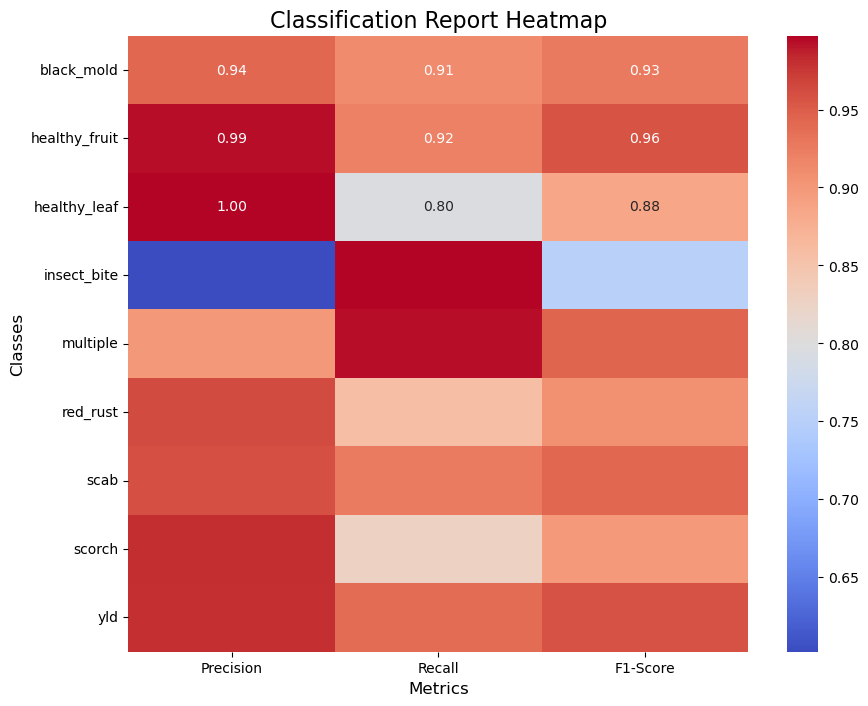

In [68]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Load the test data using the same data generator
test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Make predictions using the trained CNN model on the test data
predictions = cnn_model.predict(test_generator)
predicted_labels = np.argmax(predictions, axis=1)

# Get the true labels for the test data
true_labels = test_generator.classes

# Generate the classification report
target_names = list(test_generator.class_indices.keys())
class_report = classification_report(true_labels, predicted_labels, target_names=target_names, output_dict=True)

# Extract precision, recall, and f1-score
report_df = {}
for class_name, metrics in class_report.items():
    if class_name != 'accuracy' and class_name != 'macro avg' and class_name != 'weighted avg':
        report_df[class_name] = [metrics['precision'], metrics['recall'], metrics['f1-score']]

# Convert the report dictionary to a numpy array for plotting
report_array = np.array(list(report_df.values()))

# Create a heatmap of the classification report
plt.figure(figsize=(10, 8))
sns.heatmap(report_array, annot=True, cmap='coolwarm', xticklabels=['Precision', 'Recall', 'F1-Score'],
            yticklabels=list(report_df.keys()), cbar=True, fmt='.2f')

plt.title("Classification Report Heatmap", fontsize=16)
plt.xlabel("Metrics", fontsize=12)
plt.ylabel("Classes", fontsize=12)
plt.show()


In [71]:
import numpy as np
from sklearn.metrics import classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from termcolor import colored

# ANSI escape sequences for background colors
BACKGROUND_COLORS = {
    'green': '\033[48;5;22m',    # Dark Green
    'yellow': '\033[48;5;226m',  # Light Yellow
    'cyan': '\033[48;5;37m',     # Light Blue
    'red': '\033[48;5;160m',     # Light Red
    'reset': '\033[0m'           # Reset to default
}

# Load the test data using the same data generator
test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Make predictions using the trained CNN model on the test data
predictions = cnn_model.predict(test_generator)
predicted_labels = np.argmax(predictions, axis=1)

# Get the true labels for the test data
true_labels = test_generator.classes

# Generate the classification report
target_names = list(test_generator.class_indices.keys())
class_report = classification_report(true_labels, predicted_labels, target_names=target_names)

# Function to display the classification report with colorful background
def print_colored_class_report(class_report):
    for line in class_report.split('\n'):
        if 'accuracy' in line:
            print(f"{BACKGROUND_COLORS['green']}{line}{BACKGROUND_COLORS['reset']}")  # Green background for accuracy
        elif 'macro avg' in line or 'weighted avg' in line:
            print(f"{BACKGROUND_COLORS['pink']}{line}{BACKGROUND_COLORS['reset']}")  # Yellow background for averages
        else:
            print(f"{BACKGROUND_COLORS['blue']}{line}{BACKGROUND_COLORS['reset']}")  # Cyan background for class-specific metrics

print("Classification Report:")
print_colored_class_report(class_report)


Found 4232 images belonging to 9 classes.


D:\anapy\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


133/133 ━━━━━━━━━━━━━━━━━━━━ 39s 290ms/step
Classification Report:


KeyError: 'blue'

Found 4232 images belonging to 9 classes.


D:\anapy\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


133/133 ━━━━━━━━━━━━━━━━━━━━ 31s 236ms/step


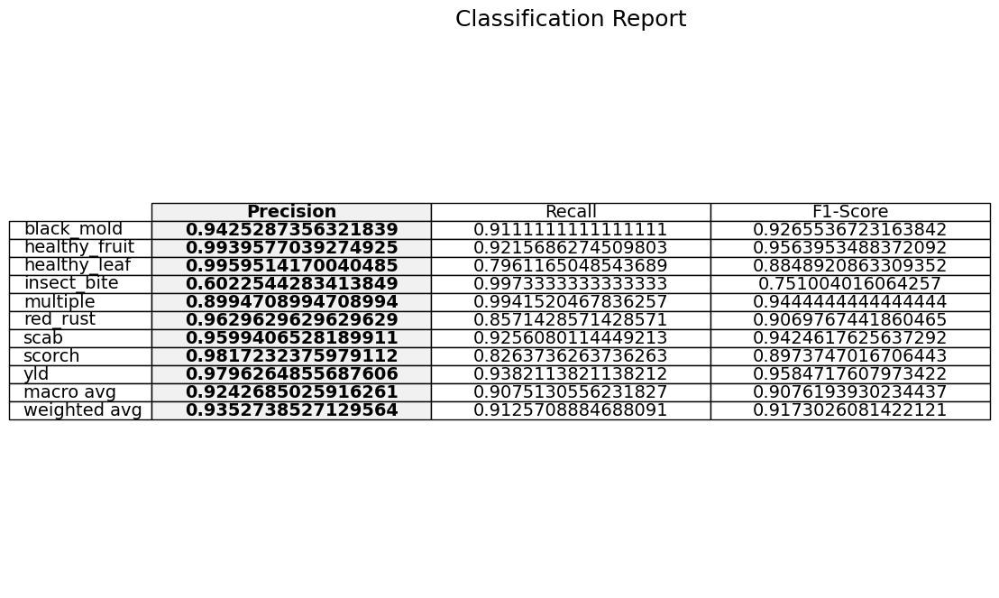

In [72]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report

# Load the test data using the same data generator
test_datagen = ImageDataGenerator(rescale=1.0 / 255.0)
test_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

# Make predictions using the trained CNN model on the test data
predictions = cnn_model.predict(test_generator)
predicted_labels = np.argmax(predictions, axis=1)

# Get the true labels for the test data
true_labels = test_generator.classes

# Generate the classification report
target_names = list(test_generator.class_indices.keys())
class_report = classification_report(true_labels, predicted_labels, target_names=target_names, output_dict=True)

# Extract precision, recall, and f1-score for each class from the report
report_data = {}
for class_name, metrics in class_report.items():
    if isinstance(metrics, dict):  # Ensure we're working with per-class metrics
        report_data[class_name] = [metrics['precision'], metrics['recall'], metrics['f1-score']]

# Convert the report dictionary to a numpy array for plotting
report_array = np.array(list(report_data.values()))

# Create a figure with a white background
fig, ax = plt.subplots(figsize=(10, 8))
ax.axis('off')
ax.set_facecolor('white')

# Create a table to display the classification report
table = ax.table(cellText=report_array, colLabels=['Precision', 'Recall', 'F1-Score'],
                rowLabels=list(report_data.keys()), loc='center', cellLoc='center')

# Style the table to make it more readable
table.auto_set_font_size(False)
table.set_fontsize(14)
table.scale(1.2, 1.2)  # Adjust table size
for (i, j), cell in table.get_celld().items():
    cell.set_edgecolor('black')
    cell.set_text_props(color='black')  # Set text color to black
    if j == 0:  # For row labels (class names)
        cell.set_text_props(fontweight='bold')
        cell.set_facecolor('#f1f1f1')  # Light gray background for class names
    else:
        cell.set_facecolor('white')  # White background for metrics

# Display the image with the classification report
plt.title('Classification Report', fontsize=18)
plt.show()


In [ ]:
# Import required libraries
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix

# Generate predictions and get true labels
test_generator = validation_datagen.flow_from_directory(  # Replace with test_dir if needed
    test_dir,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

y_true = test_generator.classes
y_pred_probs = cnn_model.predict(test_generator)
y_pred = np.argmax(y_pred_probs, axis=1)
class_labels = list(test_generator.class_indices.keys())

# Generate and print classification report
print("\n\033[1mClassification Report:\033[0m")
print(classification_report(y_true, y_pred, target_names=class_labels, digits=4))

# Generate confusion matrix heatmap
plt.figure(figsize=(12, 10))
cm = confusion_matrix(y_true, y_pred)
sns.heatmap(cm, annot=True, fmt='d', cmap='coolwarm', 
           xticklabels=class_labels, 
           yticklabels=class_labels,
           linewidths=0.5, linecolor='black')

plt.title('\033[1mConfusion Matrix\033[0m', fontsize=16, pad=20)
plt.xlabel('\033[1mPredicted Labels\033[0m', fontsize=12)
plt.ylabel('\033[1mTrue Labels\033[0m', fontsize=12)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.tight_layout()

# Save and show plot
plt.savefig('confusion_matrix_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()


Found 4232 images belonging to 9 classes.


D:\anapy\Lib\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


109/133 ━━━━━━━━━━━━━━━━━━━━ 6s 280ms/step